El archivo 'productos_ingredientes_identificados.json' ha sido generado con éxito.
              ingredients_text ingredientes_identificados
0                      Cheddar                         []
1  Butter (Milk), Salt (1.5%).             [milk, butter]
2               Salmon (Fish).                     [fish]
3         Clementine, Mandarin                         []
4                      Avocado                         []
Total de ingredientes identificados: 35
  Ingrediente  Frecuencia
0       onion       15565
1        milk       14739
2      butter       11830
3        rice       10061
4      tomato        9808
El archivo 'frecuencia_ingredientes.csv' ha sido generado con éxito.


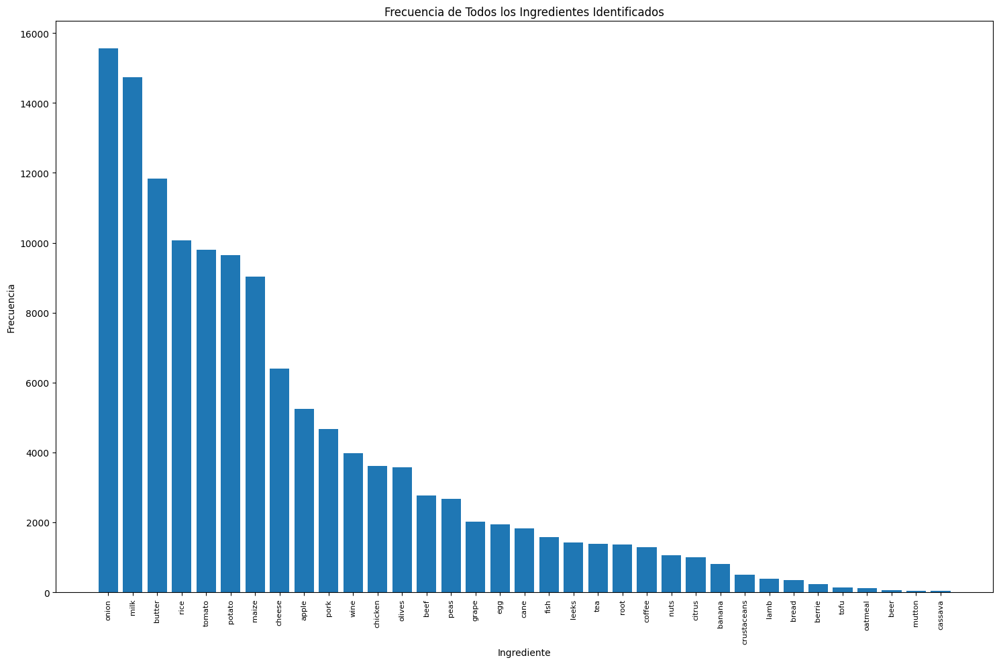

Frecuencia del número de ingredientes por producto:
    Número de Ingredientes  Frecuencia
0                        0       45585
1                        1       21762
2                        2       14343
3                        3        8101
4                        4        5352
5                        5        3416
6                        6        1358
7                        7         689
8                        8         331
9                        9         117
10                      10          61
12                      11          11
11                      12          35
15                      13           1
13                      14           2
14                      15           2
El archivo 'frecuencia_ingredientes_por_producto.csv' ha sido generado con éxito.


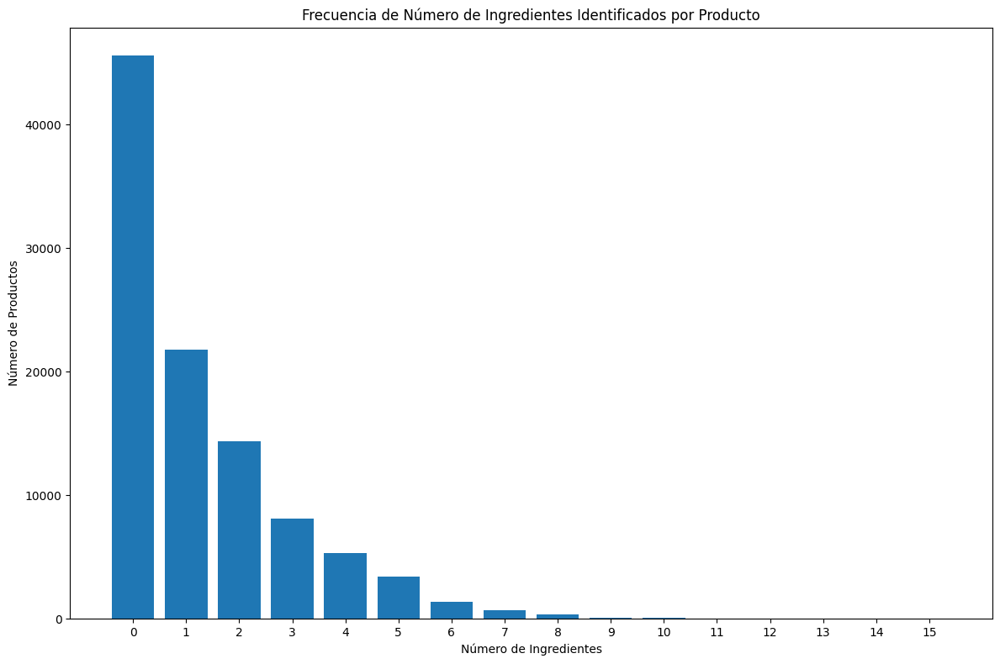

In [1]:
import pandas as pd
import re
import json
import matplotlib.pyplot as plt

# Cargar ingredientes normalizados
ingredientes_totales = pd.read_csv("ingredientes+huella.csv", usecols=["ingredient_normalized"], sep=";")

# Cargar productos
file_path = '../data/raw/products_utf8.csv'
productos = pd.read_csv(file_path, usecols=["ingredients_text"], encoding='utf-8')

# Limpiar y estandarizar la lista de ingredientes normalizados
def normalizar_ingrediente(ingrediente):
    ingrediente = ingrediente.lower().strip()
    ingrediente = re.sub(r'[^\w\s]', '', ingrediente)  # Eliminar caracteres especiales
    return ingrediente

ingredientes_set = set(
    ingredientes_totales['ingredient_normalized']
    .dropna()
    .apply(normalizar_ingrediente)
)

# Función para manejar plurales
def singular_plural_match(palabra, ingredientes_set):
    if palabra in ingredientes_set:
        return palabra
    elif palabra.endswith('s') and palabra[:-1] in ingredientes_set:
        return palabra[:-1]  # Singular
    elif palabra + 's' in ingredientes_set:
        return palabra + 's'  # Plural
    return None

# Función para buscar ingredientes en el texto ambiguo
def identificar_ingredientes(texto, ingredientes_set):
    if pd.isna(texto):
        return []
    texto = texto.lower()
    texto = re.sub(r'[^\w\s,;:]', '', texto)  # Limpiar caracteres no deseados
    palabras = re.split(r'[ ,;:]', texto)  # Separar por delimitadores
    ingredientes_encontrados = [
        singular_plural_match(palabra.strip(), ingredientes_set)
        for palabra in palabras
        if singular_plural_match(palabra.strip(), ingredientes_set)
    ]
    return list(set(ingredientes_encontrados))  # Eliminar duplicados

# Aplicar la función a toda la base de datos
productos['ingredientes_identificados'] = productos['ingredients_text'].apply(
    lambda x: identificar_ingredientes(x, ingredientes_set)
)

# Seleccionar columnas relevantes
resultado = productos[['ingredients_text', 'ingredientes_identificados']]

# Guardar el resultado en un archivo JSON
resultado_json = resultado.to_json(orient='records', indent=2, force_ascii=False)
with open("productos_ingredientes_identificados.json", "w", encoding="utf-8") as file:
    file.write(resultado_json)

# Confirmación y muestra de ejemplo
print("El archivo 'productos_ingredientes_identificados.json' ha sido generado con éxito.")
print(resultado.head())

# Cargar el archivo JSON generado previamente
with open("productos_ingredientes_identificados.json", "r", encoding="utf-8") as file:
    data = json.load(file)

# Convertir a un DataFrame
df = pd.DataFrame(data)

# Aplanar la lista de ingredientes identificados en una sola lista
ingredientes_lista = df['ingredientes_identificados'].explode()

# Calcular las frecuencias de cada ingrediente
frecuencias = ingredientes_lista.value_counts().reset_index()
frecuencias.columns = ['Ingrediente', 'Frecuencia']

# Mostrar el número total de ingredientes identificados y una muestra
print(f"Total de ingredientes identificados: {frecuencias.shape[0]}")
print(frecuencias.head())

# Guardar las frecuencias en un archivo CSV
frecuencias.to_csv("frecuencia_ingredientes.csv", index=False)
print("El archivo 'frecuencia_ingredientes.csv' ha sido generado con éxito.")

# Crear un diagrama de barras con todas las frecuencias
plt.figure(figsize=(15, 10))
plt.bar(frecuencias['Ingrediente'], frecuencias['Frecuencia'])
plt.xticks(rotation=90, fontsize=8)
plt.title("Frecuencia de Todos los Ingredientes Identificados")
plt.xlabel("Ingrediente")
plt.ylabel("Frecuencia")
plt.tight_layout()
plt.show()

# Calcular el número de ingredientes identificados por producto
df['num_ingredientes'] = df['ingredientes_identificados'].apply(lambda x: len(x))

# Calcular las frecuencias del número de ingredientes
frecuencia_productos = df['num_ingredientes'].value_counts().reset_index()
frecuencia_productos.columns = ['Número de Ingredientes', 'Frecuencia']
frecuencia_productos = frecuencia_productos.sort_values(by='Número de Ingredientes')

# Mostrar la tabla de frecuencias
print("Frecuencia del número de ingredientes por producto:")
print(frecuencia_productos)

# Guardar las frecuencias en un archivo CSV
frecuencia_productos.to_csv("frecuencia_ingredientes_por_producto.csv", index=False)
print("El archivo 'frecuencia_ingredientes_por_producto.csv' ha sido generado con éxito.")

# Crear un diagrama de barras
plt.figure(figsize=(12, 8))
plt.bar(frecuencia_productos['Número de Ingredientes'], frecuencia_productos['Frecuencia'])
plt.title("Frecuencia de Número de Ingredientes Identificados por Producto")
plt.xlabel("Número de Ingredientes")
plt.ylabel("Número de Productos")
plt.xticks(frecuencia_productos['Número de Ingredientes'])
plt.tight_layout()
plt.show()

El archivo 'productos_ingredientes_identificados_v4.json' ha sido generado con éxito.
              ingredients_text ingredientes_identificados  \
0                      Cheddar                         []   
1  Butter (Milk), Salt (1.5%).             [milk, butter]   
2               Salmon (Fish).                     [fish]   
3         Clementine, Mandarin                         []   
4                      Avocado                         []   

  ingredientes_con_porcentaje  
0                          []  
1                          []  
2                          []  
3                          []  
4                          []  
Total de ingredientes identificados: 43
       Ingrediente  Frecuencia
0       beet sugar       40465
1         palm oil       37423
2     rapeseed oil       18329
3  sunflower seeds       17198
4            onion       15565
El archivo 'frecuencia_ingredientes.csv' ha sido generado con éxito.


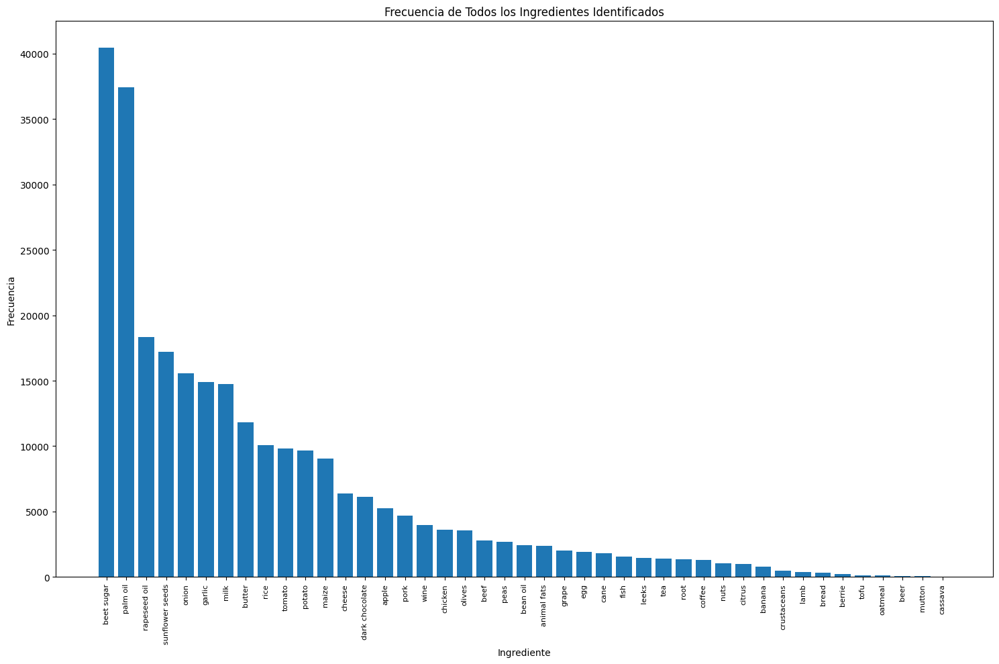

Frecuencia del número de ingredientes por producto:
    Número de Ingredientes  Frecuencia
0                        0       33936
1                        1       14168
2                        2       10963
3                        3        8871
4                        4        7465
5                        5        6864
6                        6        6150
7                        7        4821
8                        8        3448
9                        9        2113
10                      10        1107
11                      11         607
12                      12         340
13                      13         171
14                      14          69
15                      15          28
17                      16          14
16                      17          26
20                      18           1
19                      19           2
18                      20           2
El archivo 'frecuencia_ingredientes_por_producto.csv' ha sido generado con éxito.


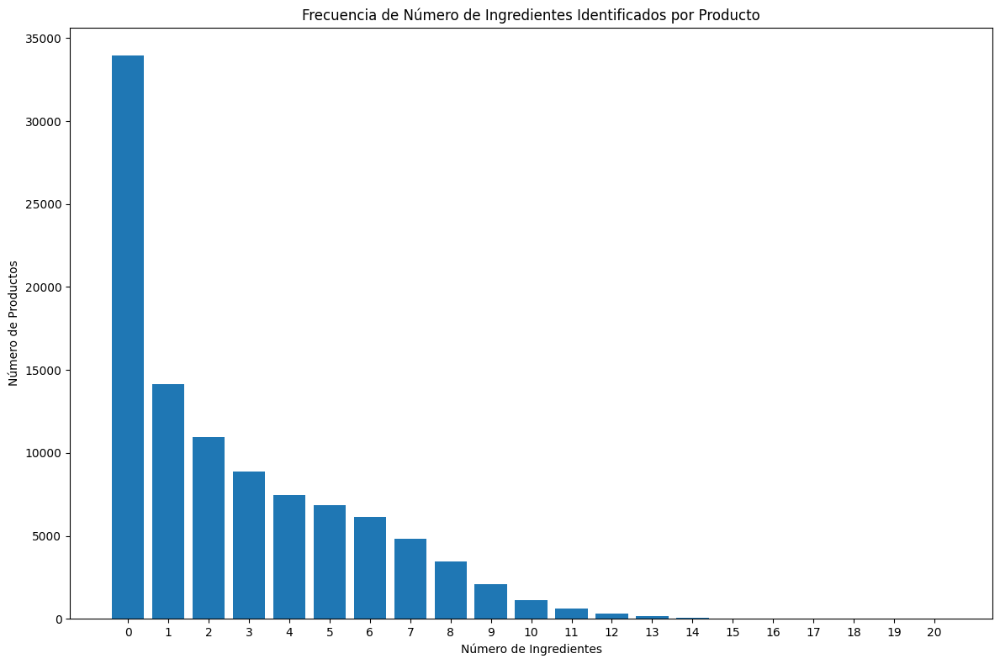

In [4]:
import pandas as pd
import re
import json
import matplotlib.pyplot as plt

# Cargar ingredientes normalizados
ingredientes_totales = pd.read_csv("ingredientes+huella.csv", usecols=["ingredient_normalized"], sep=";")

# Agregar "garlic" como ingrediente normalizado adicional
ingredientes_totales = pd.concat([
ingredientes_totales, 
pd.DataFrame({"ingredient_normalized": ["garlic"]})
], ignore_index=True)

# Cargar productos
file_path = '../data/raw/products_utf8.csv'
productos = pd.read_csv(file_path, usecols=["ingredients_text"], encoding='utf-8')

# Limpiar y estandarizar la lista de ingredientes normalizados
def normalizar_ingrediente(ingrediente):
    ingrediente = ingrediente.lower().strip()
    ingrediente = re.sub(r'[^\w\s]', '', ingrediente)  # Eliminar caracteres especiales
    return ingrediente

ingredientes_set = set(
    ingredientes_totales['ingredient_normalized']
    .dropna()
    .apply(normalizar_ingrediente)
)

# Función para manejar nombres compuestos y plurales
def singular_plural_compound_match(palabra, ingredientes_set):
    if palabra in ingredientes_set:
        return palabra
    elif palabra.endswith('s') and palabra[:-1] in ingredientes_set:
        return palabra[:-1]  # Singular
    elif palabra + 's' in ingredientes_set:
        return palabra + 's'  # Plural
    else:
        for ingrediente in ingredientes_set:
            if palabra in ingrediente.split():  # Verificar palabras compuestas
                return ingrediente
    return None

# Función para extraer ingredientes con porcentaje y normalizar
def extraer_ingrediente_con_porcentaje(texto):
    matches = re.findall(r'(\w+(?:\s\w+)*)\s*\((\d+\%)\)', texto)
    return [{"ingrediente": normalizar_ingrediente(match[0]), "porcentaje": match[1]} for match in matches]

# Función para buscar ingredientes en el texto ambiguo
def identificar_ingredientes(texto, ingredientes_set):
    if pd.isna(texto):
        return []
    texto = texto.lower()
    texto = re.sub(r'[^\w\s,;:]', '', texto)  # Limpiar caracteres no deseados
    palabras = re.split(r'[ ,;:]', texto)  # Separar por delimitadores
    ingredientes_encontrados = [
        singular_plural_compound_match(palabra.strip(), ingredientes_set)
        for palabra in palabras
        if singular_plural_compound_match(palabra.strip(), ingredientes_set)
    ]
    return list(set(ingredientes_encontrados))  # Eliminar duplicados

# Aplicar las funciones a toda la base de datos
productos['ingredientes_identificados'] = productos['ingredients_text'].apply(
    lambda x: identificar_ingredientes(x, ingredientes_set)
)
productos['ingredientes_con_porcentaje'] = productos['ingredients_text'].apply(
    lambda x: extraer_ingrediente_con_porcentaje(x) if isinstance(x, str) else []
)

# Seleccionar columnas relevantes
resultado = productos[['ingredients_text', 'ingredientes_identificados', 'ingredientes_con_porcentaje']]

# Guardar el resultado en un archivo JSON
resultado_json = resultado.to_json(orient='records', indent=2, force_ascii=False)
with open("productos_ingredientes_identificados_v4.json", "w", encoding="utf-8") as file:
    file.write(resultado_json)

# Confirmación y muestra de ejemplo
print("El archivo 'productos_ingredientes_identificados_v4.json' ha sido generado con éxito.")
print(resultado.head())

# Cargar el archivo JSON generado previamente
with open("productos_ingredientes_identificados_v4.json", "r", encoding="utf-8") as file:
    data = json.load(file)

# Convertir a un DataFrame
df = pd.DataFrame(data)

# Aplanar la lista de ingredientes identificados en una sola lista
ingredientes_lista = df['ingredientes_identificados'].explode()

# Calcular las frecuencias de cada ingrediente
frecuencias = ingredientes_lista.value_counts().reset_index()
frecuencias.columns = ['Ingrediente', 'Frecuencia']

# Mostrar el número total de ingredientes identificados y una muestra
print(f"Total de ingredientes identificados: {frecuencias.shape[0]}")
print(frecuencias.head())

# Guardar las frecuencias en un archivo CSV
frecuencias.to_csv("frecuencia_ingredientes.csv", index=False)
print("El archivo 'frecuencia_ingredientes.csv' ha sido generado con éxito.")

# Crear un diagrama de barras con todas las frecuencias
plt.figure(figsize=(15, 10))
plt.bar(frecuencias['Ingrediente'], frecuencias['Frecuencia'])
plt.xticks(rotation=90, fontsize=8)
plt.title("Frecuencia de Todos los Ingredientes Identificados")
plt.xlabel("Ingrediente")
plt.ylabel("Frecuencia")
plt.tight_layout()
plt.show()

# Calcular el número de ingredientes identificados por producto
df['num_ingredientes'] = df['ingredientes_identificados'].apply(lambda x: len(x))

# Calcular las frecuencias del número de ingredientes
frecuencia_productos = df['num_ingredientes'].value_counts().reset_index()
frecuencia_productos.columns = ['Número de Ingredientes', 'Frecuencia']
frecuencia_productos = frecuencia_productos.sort_values(by='Número de Ingredientes')

# Mostrar la tabla de frecuencias
print("Frecuencia del número de ingredientes por producto:")
print(frecuencia_productos)

# Guardar las frecuencias en un archivo CSV
frecuencia_productos.to_csv("frecuencia_ingredientes_por_producto.csv", index=False)
print("El archivo 'frecuencia_ingredientes_por_producto.csv' ha sido generado con éxito.")

# Crear un diagrama de barras
plt.figure(figsize=(12, 8))
plt.bar(frecuencia_productos['Número de Ingredientes'], frecuencia_productos['Frecuencia'])
plt.title("Frecuencia de Número de Ingredientes Identificados por Producto")
plt.xlabel("Número de Ingredientes")
plt.ylabel("Número de Productos")
plt.xticks(frecuencia_productos['Número de Ingredientes'])
plt.tight_layout()
plt.show()




El archivo 'productos_ingredientes_identificados_v5.json' ha sido generado con éxito.
              ingredients_text ingredientes_identificados  \
0                      Cheddar                         []   
1  Butter (Milk), Salt (1.5%).             [milk, butter]   
2               Salmon (Fish).                     [fish]   
3         Clementine, Mandarin                         []   
4                      Avocado                         []   

  ingredientes_con_porcentaje  
0                          []  
1                          []  
2                          []  
3                          []  
4                          []  
Total de ingredientes identificados: 49
       Ingrediente  Frecuencia
0            sugar       40593
1         palm oil       37423
2     rapeseed oil       18329
3  sunflower seeds       17198
4            onion       15565
El archivo 'frecuencia_ingredientes.csv' ha sido generado con éxito.


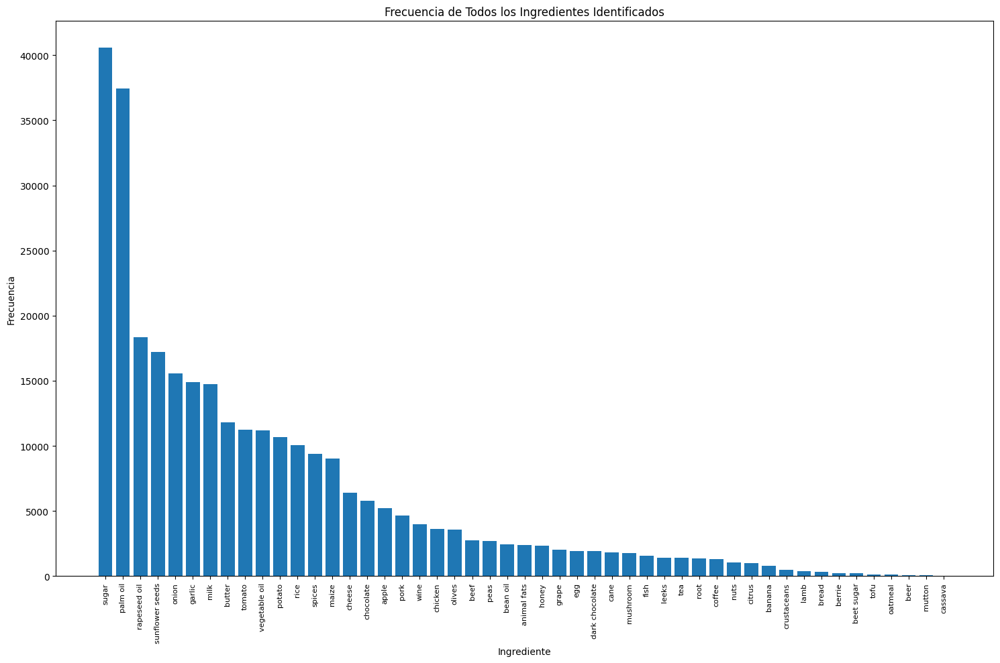

Frecuencia del número de ingredientes por producto:
    Número de Ingredientes  Frecuencia
0                        0       33288
1                        1       13742
2                        2        9876
3                        3        8293
4                        4        6838
5                        5        6358
6                        6        5885
7                        7        5218
8                        8        4308
9                        9        2939
10                      10        2226
11                      11         977
12                      12         506
13                      13         338
14                      14         212
15                      15          79
17                      16          25
16                      17          33
18                      18          19
19                      19           4
21                      20           1
20                      22           1
El archivo 'frecuencia_ingredientes_por_producto.cs

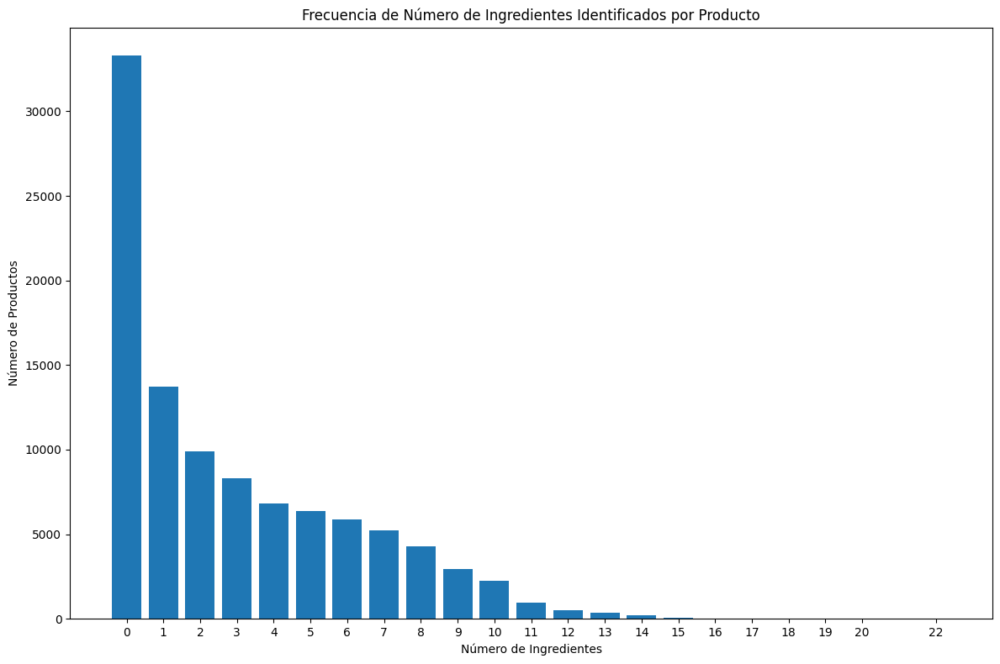

El archivo 'productos_ingredientes_identificados_v5.json' ha sido generado con éxito.
              ingredients_text ingredientes_identificados  \
0                      Cheddar                         []   
1  Butter (Milk), Salt (1.5%).             [milk, butter]   
2               Salmon (Fish).                     [fish]   
3         Clementine, Mandarin                         []   
4                      Avocado                         []   

  ingredientes_con_porcentaje  
0                          []  
1                          []  
2                          []  
3                          []  
4                          []  
Total de ingredientes identificados: 49
       Ingrediente  Frecuencia
0            sugar       40593
1         palm oil       37423
2     rapeseed oil       18329
3  sunflower seeds       17198
4            onion       15565
El archivo 'frecuencia_ingredientes.csv' ha sido generado con éxito.


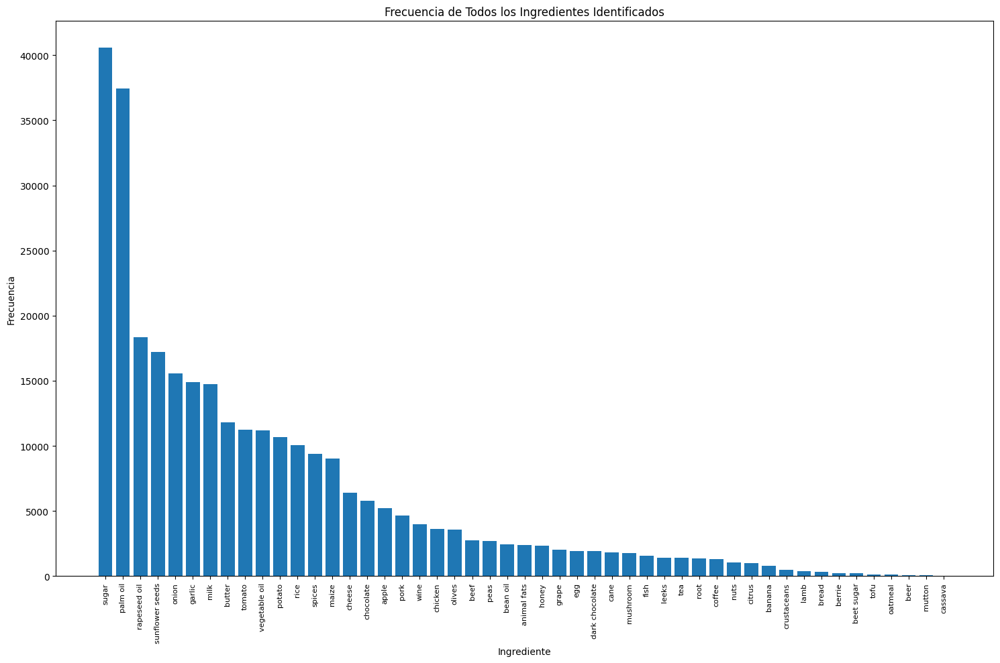

Frecuencia del número de ingredientes por producto:
    Número de Ingredientes  Frecuencia
0                        0       33288
1                        1       13742
2                        2        9876
3                        3        8293
4                        4        6838
5                        5        6358
6                        6        5885
7                        7        5218
8                        8        4308
9                        9        2939
10                      10        2226
11                      11         977
12                      12         506
13                      13         338
14                      14         212
15                      15          79
17                      16          25
16                      17          33
18                      18          19
19                      19           4
21                      20           1
20                      22           1
El archivo 'frecuencia_ingredientes_por_producto.cs

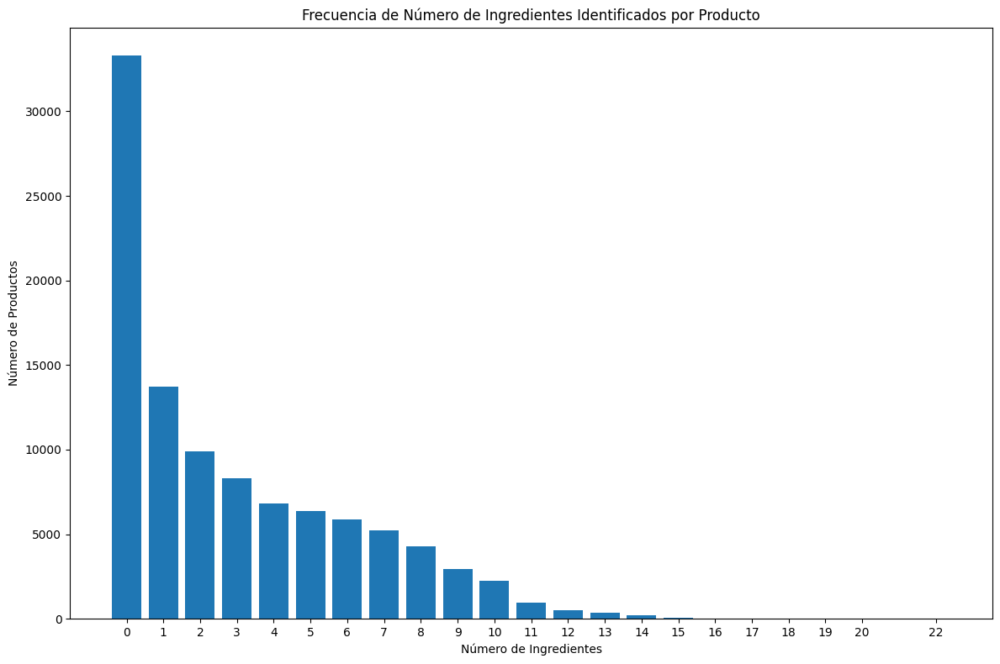

In [6]:
import pandas as pd
import re
import json
import matplotlib.pyplot as plt

# Cargar ingredientes normalizados
ingredientes_totales = pd.read_csv("ingredientes+huella.csv", usecols=["ingredient_normalized"], sep=";")

# Agregar nuevos ingredientes normalizados adicionales
ingredientes_adicionales = [
    "garlic", "sugar", "spices", "chocolate", "mushroom", "parsle", "vegetable oil", "honey"
]
ingredientes_totales = pd.concat([
    ingredientes_totales,
    pd.DataFrame({"ingredient_normalized": ingredientes_adicionales})
], ignore_index=True)

# Crear un diccionario de mapeo de sinónimos o ingredientes vinculados
ingredientes_vinculados = {
    "glucose": "sugar",
    "dextrose": "sugar",
    "maltodextrin": "sugar",
    "wheatflour": "bread",
    "flour": "bread",
    "wheatstarch": "bread",
    "cornflour": "maize",
    "cocoa": "chocolate",
    "yeast": "mushroom",
    "black pepper": "spices",
    "cheddar": "cheese",
    "sweeteners": "sugar"
}

# Cargar productos
file_path = '../data/raw/products_utf8.csv'
productos = pd.read_csv(file_path, usecols=["ingredients_text"], encoding='utf-8')

# Limpiar y estandarizar la lista de ingredientes normalizados
def normalizar_ingrediente(ingrediente):
    ingrediente = ingrediente.lower().strip()
    ingrediente = re.sub(r'[^\w\s]', '', ingrediente)  # Eliminar caracteres especiales
    return ingrediente

ingredientes_set = set(
    ingredientes_totales['ingredient_normalized']
    .dropna()
    .apply(normalizar_ingrediente)
)

# Función para manejar nombres compuestos, plurales y reglas "es"
def singular_plural_compound_match(palabra, ingredientes_set):
    if palabra in ingredientes_set:
        return palabra
    elif palabra.endswith('s') and palabra[:-1] in ingredientes_set:
        return palabra[:-1]  # Singular
    elif palabra + 's' in ingredientes_set:
        return palabra + 's'  # Plural
    elif palabra.endswith('es') and palabra[:-2] in ingredientes_set:
        return palabra[:-2]  # Reglas "es" (tomatoes -> tomato)
    elif palabra + 'es' in ingredientes_set:
        return palabra + 'es'  # Plural con "es"
    else:
        for ingrediente in ingredientes_set:
            if palabra in ingrediente.split():  # Verificar palabras compuestas
                return ingrediente
    return None

# Función para extraer ingredientes con porcentaje y normalizar
def extraer_ingrediente_con_porcentaje(texto):
    matches = re.findall(r'(\w+(?:\s\w+)*)\s*\((\d+\%)\)', texto)
    return [{"ingrediente": normalizar_ingrediente(match[0]), "porcentaje": match[1]} for match in matches]

# Función para buscar ingredientes en el texto ambiguo
def identificar_ingredientes(texto, ingredientes_set):
    if pd.isna(texto):
        return []
    texto = texto.lower()
    texto = re.sub(r'[^\w\s,;:]', '', texto)  # Limpiar caracteres no deseados
    palabras = re.split(r'[ ,;:]', texto)  # Separar por delimitadores
    ingredientes_encontrados = [
        singular_plural_compound_match(palabra.strip(), ingredientes_set)
        for palabra in palabras
        if singular_plural_compound_match(palabra.strip(), ingredientes_set)
    ]
    # Aplicar mapeo de ingredientes vinculados
    ingredientes_mapeados = [
        ingredientes_vinculados.get(ing, ing) for ing in ingredientes_encontrados
    ]
    return list(set(ingredientes_mapeados))  # Eliminar duplicados

# Aplicar las funciones a toda la base de datos
productos['ingredientes_identificados'] = productos['ingredients_text'].apply(
    lambda x: identificar_ingredientes(x, ingredientes_set)
)
productos['ingredientes_con_porcentaje'] = productos['ingredients_text'].apply(
    lambda x: extraer_ingrediente_con_porcentaje(x) if isinstance(x, str) else []
)

# Seleccionar columnas relevantes
resultado = productos[['ingredients_text', 'ingredientes_identificados', 'ingredientes_con_porcentaje']]

# Guardar el resultado en un archivo JSON
resultado_json = resultado.to_json(orient='records', indent=2, force_ascii=False)
with open("productos_ingredientes_identificados_v5.json", "w", encoding="utf-8") as file:
    file.write(resultado_json)

# Confirmación y muestra de ejemplo
print("El archivo 'productos_ingredientes_identificados_v5.json' ha sido generado con éxito.")
print(resultado.head())

# Cargar el archivo JSON generado previamente
with open("productos_ingredientes_identificados_v5.json", "r", encoding="utf-8") as file:
    data = json.load(file)

# Convertir a un DataFrame
df = pd.DataFrame(data)

# Aplanar la lista de ingredientes identificados en una sola lista
ingredientes_lista = df['ingredientes_identificados'].explode()

# Calcular las frecuencias de cada ingrediente
frecuencias = ingredientes_lista.value_counts().reset_index()
frecuencias.columns = ['Ingrediente', 'Frecuencia']

# Mostrar el número total de ingredientes identificados y una muestra
print(f"Total de ingredientes identificados: {frecuencias.shape[0]}")
print(frecuencias.head())

# Guardar las frecuencias en un archivo CSV
frecuencias.to_csv("frecuencia_ingredientes.csv", index=False)
print("El archivo 'frecuencia_ingredientes.csv' ha sido generado con éxito.")

# Crear un diagrama de barras con todas las frecuencias
plt.figure(figsize=(15, 10))
plt.bar(frecuencias['Ingrediente'], frecuencias['Frecuencia'])
plt.xticks(rotation=90, fontsize=8)
plt.title("Frecuencia de Todos los Ingredientes Identificados")
plt.xlabel("Ingrediente")
plt.ylabel("Frecuencia")
plt.tight_layout()
plt.show()

# Calcular el número de ingredientes identificados por producto
df['num_ingredientes'] = df['ingredientes_identificados'].apply(lambda x: len(x))

# Calcular las frecuencias del número de ingredientes
frecuencia_productos = df['num_ingredientes'].value_counts().reset_index()
frecuencia_productos.columns = ['Número de Ingredientes', 'Frecuencia']
frecuencia_productos = frecuencia_productos.sort_values(by='Número de Ingredientes')

# Mostrar la tabla de frecuencias
print("Frecuencia del número de ingredientes por producto:")
print(frecuencia_productos)

# Guardar las frecuencias en un archivo CSV
frecuencia_productos.to_csv("frecuencia_ingredientes_por_producto.csv", index=False)
print("El archivo 'frecuencia_ingredientes_por_producto.csv' ha sido generado con éxito.")

# Crear un diagrama de barras
plt.figure(figsize=(12, 8))
plt.bar(frecuencia_productos['Número de Ingredientes'], frecuencia_productos['Frecuencia'])
plt.title("Frecuencia de Número de Ingredientes Identificados por Producto")
plt.xlabel("Número de Ingredientes")
plt.ylabel("Número de Productos")
plt.xticks(frecuencia_productos['Número de Ingredientes'])
plt.tight_layout()
plt.show()


El archivo 'productos_ingredientes_identificados_v6.json' ha sido generado con éxito.
              ingredients_text ingredientes_identificados  \
0                      Cheddar                         []   
1  Butter (Milk), Salt (1.5%).             [milk, butter]   
2               Salmon (Fish).                     [fish]   
3         Clementine, Mandarin                         []   
4                      Avocado                         []   

  ingredientes_con_porcentaje  
0                          []  
1                          []  
2                          []  
3                          []  
4                          []  
Total de ingredientes identificados: 49
       Ingrediente  Frecuencia
0            sugar       40593
1         palm oil       37423
2     rapeseed oil       18329
3  sunflower seeds       17198
4            onion       15565
El archivo 'frecuencia_ingredientes.csv' ha sido generado con éxito.


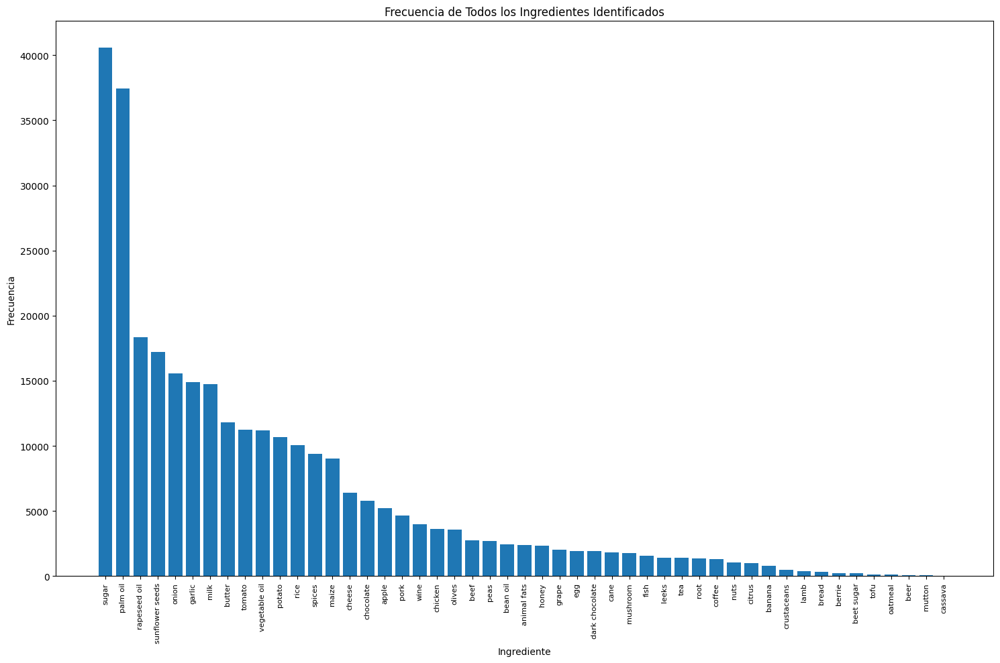

Frecuencia del número de ingredientes por producto:
    Número de Ingredientes  Frecuencia
0                        0       33288
1                        1       13742
2                        2        9876
3                        3        8293
4                        4        6838
5                        5        6358
6                        6        5885
7                        7        5218
8                        8        4308
9                        9        2939
10                      10        2226
11                      11         977
12                      12         506
13                      13         338
14                      14         212
15                      15          79
17                      16          25
16                      17          33
18                      18          19
19                      19           4
21                      20           1
20                      22           1
El archivo 'frecuencia_ingredientes_por_producto.cs

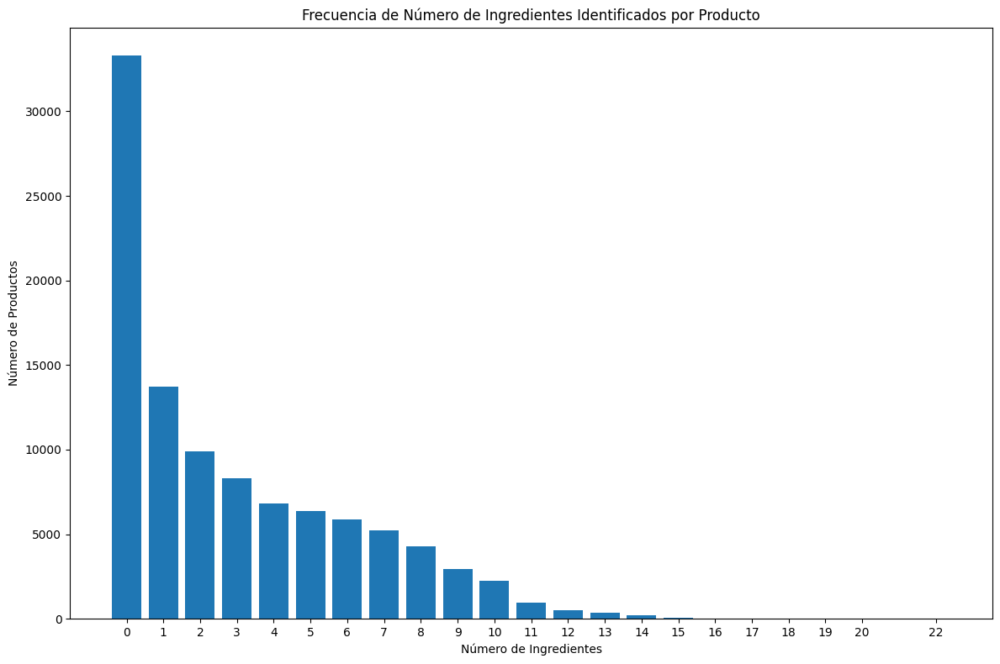

In [7]:
import pandas as pd
import re
import json
import matplotlib.pyplot as plt

# Cargar ingredientes normalizados
ingredientes_totales = pd.read_csv("ingredientes+huella.csv", usecols=["ingredient_normalized"], sep=";")

# Agregar nuevos ingredientes normalizados adicionales
ingredientes_adicionales = [
    "garlic", "sugar", "spices", "chocolate", "mushroom", "parsle", "vegetable oil", "honey"
]
ingredientes_totales = pd.concat([
    ingredientes_totales,
    pd.DataFrame({"ingredient_normalized": ingredientes_adicionales})
], ignore_index=True)

# Crear un diccionario de mapeo de sinónimos o ingredientes vinculados
ingredientes_vinculados = {
    "glucose": "sugar",
    "dextrose": "sugar",
    "maltodextrin": "sugar",
    "wheatflour": "bread",
    "flour": "bread",
    "wheatstarch": "bread",
    "cornflour": "maize",
    "cocoa": "chocolate",
    "yeast": "mushroom",
    "black pepper": "spices",
    "cheddar": "cheese",
    "sweeteners": "sugar"
}

# Cargar productos
file_path = '../data/raw/products_utf8.csv'
productos = pd.read_csv(file_path, usecols=["ingredients_text"], encoding='utf-8')

# Limpiar y estandarizar la lista de ingredientes normalizados
def normalizar_ingrediente(ingrediente):
    ingrediente = ingrediente.lower().strip()
    ingrediente = re.sub(r'[^\w\s]', '', ingrediente)  # Eliminar caracteres especiales
    return ingrediente

ingredientes_set = set(
    ingredientes_totales['ingredient_normalized']
    .dropna()
    .apply(normalizar_ingrediente)
)

# Función para manejar nombres compuestos, plurales y reglas "es"
def singular_plural_compound_match(palabra, ingredientes_set):
    palabra = palabra.lower().strip()  # Asegurarse de manejar mayúsculas/minúsculas
    if palabra in ingredientes_set:
        return palabra
    elif palabra.endswith('s') and palabra[:-1] in ingredientes_set:
        return palabra[:-1]  # Singular
    elif palabra + 's' in ingredientes_set:
        return palabra + 's'  # Plural
    elif palabra.endswith('es') and palabra[:-2] in ingredientes_set:
        return palabra[:-2]  # Reglas "es" (tomatoes -> tomato)
    elif palabra + 'es' in ingredientes_set:
        return palabra + 'es'  # Plural con "es"
    else:
        for ingrediente in ingredientes_set:
            if palabra in ingrediente.split():  # Verificar palabras compuestas
                return ingrediente
    return None

# Función para extraer ingredientes con porcentaje y normalizar
def extraer_ingrediente_con_porcentaje(texto):
    matches = re.findall(r'(\w+(?:\s\w+)*)\s*\((\d+\%)\)', texto)
    return [{"ingrediente": normalizar_ingrediente(match[0]), "porcentaje": match[1]} for match in matches]

# Función para buscar ingredientes en el texto ambiguo
def identificar_ingredientes(texto, ingredientes_set):
    if pd.isna(texto):
        return []
    texto = texto.lower()
    texto = re.sub(r'[^\w\s,;:]', '', texto)  # Limpiar caracteres no deseados
    palabras = re.split(r'[ ,;:]', texto)  # Separar por delimitadores
    ingredientes_encontrados = [
        singular_plural_compound_match(palabra.strip(), ingredientes_set)
        for palabra in palabras
        if singular_plural_compound_match(palabra.strip(), ingredientes_set)
    ]
    # Aplicar mapeo de ingredientes vinculados
    ingredientes_mapeados = [
        ingredientes_vinculados.get(ing.lower(), ing) for ing in ingredientes_encontrados
    ]
    return list(set(ingredientes_mapeados))  # Eliminar duplicados

# Aplicar las funciones a toda la base de datos
productos['ingredientes_identificados'] = productos['ingredients_text'].apply(
    lambda x: identificar_ingredientes(x, ingredientes_set)
)
productos['ingredientes_con_porcentaje'] = productos['ingredients_text'].apply(
    lambda x: extraer_ingrediente_con_porcentaje(x) if isinstance(x, str) else []
)

# Seleccionar columnas relevantes
resultado = productos[['ingredients_text', 'ingredientes_identificados', 'ingredientes_con_porcentaje']]

# Guardar el resultado en un archivo JSON
resultado_json = resultado.to_json(orient='records', indent=2, force_ascii=False)
with open("productos_ingredientes_identificados_v6.json", "w", encoding="utf-8") as file:
    file.write(resultado_json)

# Confirmación y muestra de ejemplo
print("El archivo 'productos_ingredientes_identificados_v6.json' ha sido generado con éxito.")
print(resultado.head())

# Cargar el archivo JSON generado previamente
with open("productos_ingredientes_identificados_v6.json", "r", encoding="utf-8") as file:
    data = json.load(file)

# Convertir a un DataFrame
df = pd.DataFrame(data)

# Aplanar la lista de ingredientes identificados en una sola lista
ingredientes_lista = df['ingredientes_identificados'].explode()

# Calcular las frecuencias de cada ingrediente
frecuencias = ingredientes_lista.value_counts().reset_index()
frecuencias.columns = ['Ingrediente', 'Frecuencia']

# Mostrar el número total de ingredientes identificados y una muestra
print(f"Total de ingredientes identificados: {frecuencias.shape[0]}")
print(frecuencias.head())

# Guardar las frecuencias en un archivo CSV
frecuencias.to_csv("frecuencia_ingredientes.csv", index=False)
print("El archivo 'frecuencia_ingredientes.csv' ha sido generado con éxito.")

# Crear un diagrama de barras con todas las frecuencias
plt.figure(figsize=(15, 10))
plt.bar(frecuencias['Ingrediente'], frecuencias['Frecuencia'])
plt.xticks(rotation=90, fontsize=8)
plt.title("Frecuencia de Todos los Ingredientes Identificados")
plt.xlabel("Ingrediente")
plt.ylabel("Frecuencia")
plt.tight_layout()
plt.show()

# Calcular el número de ingredientes identificados por producto
df['num_ingredientes'] = df['ingredientes_identificados'].apply(lambda x: len(x))

# Calcular las frecuencias del número de ingredientes
frecuencia_productos = df['num_ingredientes'].value_counts().reset_index()
frecuencia_productos.columns = ['Número de Ingredientes', 'Frecuencia']
frecuencia_productos = frecuencia_productos.sort_values(by='Número de Ingredientes')

# Mostrar la tabla de frecuencias
print("Frecuencia del número de ingredientes por producto:")
print(frecuencia_productos)

# Guardar las frecuencias en un archivo CSV
frecuencia_productos.to_csv("frecuencia_ingredientes_por_producto.csv", index=False)
print("El archivo 'frecuencia_ingredientes_por_producto.csv' ha sido generado con éxito.")

# Crear un diagrama de barras
plt.figure(figsize=(12, 8))
plt.bar(frecuencia_productos['Número de Ingredientes'], frecuencia_productos['Frecuencia'])
plt.title("Frecuencia de Número de Ingredientes Identificados por Producto")
plt.xlabel("Número de Ingredientes")
plt.ylabel("Número de Productos")
plt.xticks(frecuencia_productos['Número de Ingredientes'])
plt.tight_layout()
plt.show()


El archivo 'productos_ingredientes_identificados_v7.json' ha sido generado con éxito.
              ingredients_text ingredientes_identificados  \
0                      Cheddar                         []   
1  Butter (Milk), Salt (1.5%).             [milk, butter]   
2               Salmon (Fish).                     [fish]   
3         Clementine, Mandarin                         []   
4                      Avocado                         []   

  ingredientes_con_porcentaje  
0                          []  
1                          []  
2                          []  
3                          []  
4                          []  
Total de ingredientes identificados: 49
       Ingrediente  Frecuencia
0            sugar       40593
1         palm oil       37423
2     rapeseed oil       18329
3  sunflower seeds       17198
4            onion       15565
El archivo 'frecuencia_ingredientes.csv' ha sido generado con éxito.


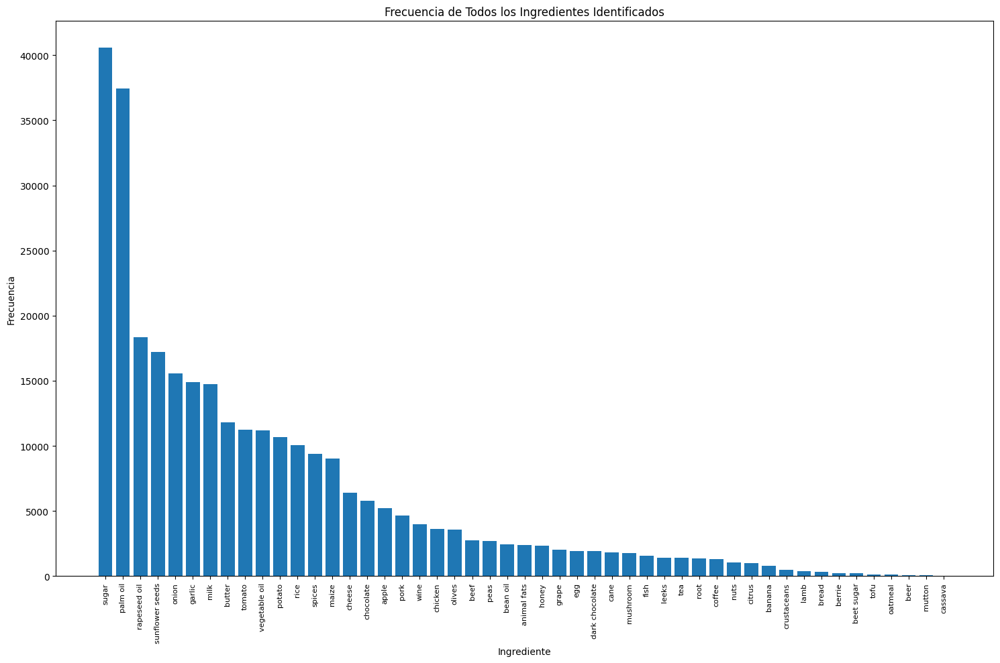

Frecuencia del número de ingredientes por producto:
    Número de Ingredientes  Frecuencia
0                        0       33288
1                        1       13742
2                        2        9876
3                        3        8293
4                        4        6838
5                        5        6358
6                        6        5885
7                        7        5218
8                        8        4308
9                        9        2939
10                      10        2226
11                      11         977
12                      12         506
13                      13         338
14                      14         212
15                      15          79
17                      16          25
16                      17          33
18                      18          19
19                      19           4
21                      20           1
20                      22           1
El archivo 'frecuencia_ingredientes_por_producto.cs

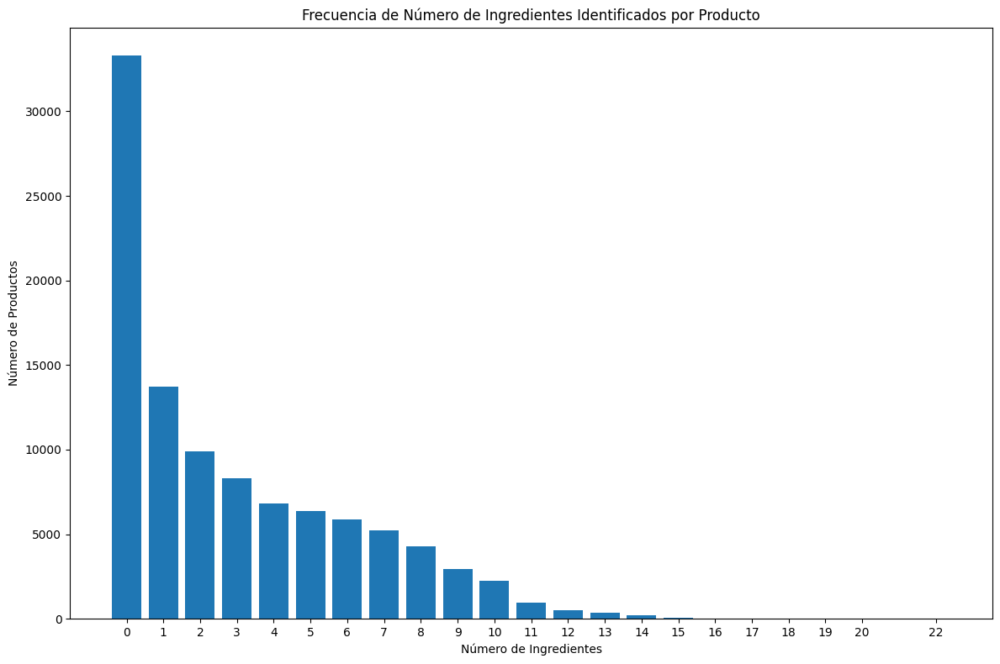

In [9]:
import pandas as pd
import re
import json
import matplotlib.pyplot as plt

# Cargar ingredientes normalizados
ingredientes_totales = pd.read_csv("ingredientes+huella.csv", usecols=["ingredient_normalized"], sep=";")

# Agregar nuevos ingredientes normalizados adicionales
ingredientes_adicionales = [
    "garlic", "sugar", "spices", "chocolate", "mushroom", "parsle", "vegetable oil", "honey"
]
ingredientes_totales = pd.concat([
    ingredientes_totales,
    pd.DataFrame({"ingredient_normalized": ingredientes_adicionales})
], ignore_index=True)

# Crear un diccionario de mapeo de sinónimos o ingredientes vinculados
ingredientes_vinculados = {
    "glucose": "sugar",
    "dextrose": "sugar",
    "maltodextrin": "sugar",
    "wheatflour": "bread",
    "flour": "bread",
    "wheatstarch": "bread",
    "cornflour": "maize",
    "cocoa": "chocolate",
    "yeast": "mushroom",
    "black pepper": "spices",
    "cheddar": "cheese",
    "Cheddar": "cheese",
    "sweeteners": "sugar"
}

# Cargar productos
file_path = '../data/raw/products_utf8.csv'
productos = pd.read_csv(file_path, usecols=["ingredients_text"], encoding='utf-8')

# Limpiar y estandarizar la lista de ingredientes normalizados
def normalizar_ingrediente(ingrediente):
    ingrediente = ingrediente.lower().strip()
    ingrediente = re.sub(r'[^\w\s]', '', ingrediente)  # Eliminar caracteres especiales
    return ingrediente

ingredientes_set = set(
    ingredientes_totales['ingredient_normalized']
    .dropna()
    .apply(normalizar_ingrediente)
)

# Función para manejar nombres compuestos, plurales y reglas "es"
def singular_plural_compound_match(palabra, ingredientes_set):
    palabra = palabra.lower().strip()  # Asegurarse de manejar mayúsculas/minúsculas
    if palabra in ingredientes_set:
        return palabra
    elif palabra.endswith('s') and palabra[:-1] in ingredientes_set:
        return palabra[:-1]  # Singular
    elif palabra + 's' in ingredientes_set:
        return palabra + 's'  # Plural
    elif palabra.endswith('es') and palabra[:-2] in ingredientes_set:
        return palabra[:-2]  # Reglas "es" (tomatoes -> tomato)
    elif palabra + 'es' in ingredientes_set:
        return palabra + 'es'  # Plural con "es"
    else:
        for ingrediente in ingredientes_set:
            if palabra in ingrediente.split():  # Verificar palabras compuestas
                return ingrediente
    return None

# Función para extraer ingredientes con porcentaje y normalizar
def extraer_ingrediente_con_porcentaje(texto):
    matches = re.findall(r'(\w+(?:\s\w+)*)\s*\((\d+\%)\)', texto)
    return [{"ingrediente": normalizar_ingrediente(match[0]), "porcentaje": match[1]} for match in matches]

# Función para buscar ingredientes en el texto ambiguo
def identificar_ingredientes(texto, ingredientes_set):
    if pd.isna(texto):
        return []
    texto = texto.lower()
    texto = re.sub(r'[^\w\s,;:]', '', texto)  # Limpiar caracteres no deseados
    palabras = re.split(r'[ ,;:]', texto)  # Separar por delimitadores
    ingredientes_encontrados = [
        singular_plural_compound_match(palabra.strip(), ingredientes_set)
        for palabra in palabras
        if singular_plural_compound_match(palabra.strip(), ingredientes_set)
    ]
    # Aplicar mapeo de ingredientes vinculados considerando plurales y mayúsculas
    ingredientes_mapeados = [
        ingredientes_vinculados.get(ing.lower().rstrip('s').rstrip('es'), ing) for ing in ingredientes_encontrados
    ]
    return list(set(ingredientes_mapeados))  # Eliminar duplicados

# Aplicar las funciones a toda la base de datos
productos['ingredientes_identificados'] = productos['ingredients_text'].apply(
    lambda x: identificar_ingredientes(x, ingredientes_set)
)
productos['ingredientes_con_porcentaje'] = productos['ingredients_text'].apply(
    lambda x: extraer_ingrediente_con_porcentaje(x) if isinstance(x, str) else []
)

# Seleccionar columnas relevantes
resultado = productos[['ingredients_text', 'ingredientes_identificados', 'ingredientes_con_porcentaje']]

# Guardar el resultado en un archivo JSON
resultado_json = resultado.to_json(orient='records', indent=2, force_ascii=False)
with open("productos_ingredientes_identificados_v7.json", "w", encoding="utf-8") as file:
    file.write(resultado_json)

# Confirmación y muestra de ejemplo
print("El archivo 'productos_ingredientes_identificados_v7.json' ha sido generado con éxito.")
print(resultado.head())

# Cargar el archivo JSON generado previamente
with open("productos_ingredientes_identificados_v7.json", "r", encoding="utf-8") as file:
    data = json.load(file)

# Convertir a un DataFrame
df = pd.DataFrame(data)

# Aplanar la lista de ingredientes identificados en una sola lista
ingredientes_lista = df['ingredientes_identificados'].explode()

# Calcular las frecuencias de cada ingrediente
frecuencias = ingredientes_lista.value_counts().reset_index()
frecuencias.columns = ['Ingrediente', 'Frecuencia']

# Mostrar el número total de ingredientes identificados y una muestra
print(f"Total de ingredientes identificados: {frecuencias.shape[0]}")
print(frecuencias.head())

# Guardar las frecuencias en un archivo CSV
frecuencias.to_csv("frecuencia_ingredientes.csv", index=False)
print("El archivo 'frecuencia_ingredientes.csv' ha sido generado con éxito.")

# Crear un diagrama de barras con todas las frecuencias
plt.figure(figsize=(15, 10))
plt.bar(frecuencias['Ingrediente'], frecuencias['Frecuencia'])
plt.xticks(rotation=90, fontsize=8)
plt.title("Frecuencia de Todos los Ingredientes Identificados")
plt.xlabel("Ingrediente")
plt.ylabel("Frecuencia")
plt.tight_layout()
plt.show()

# Calcular el número de ingredientes identificados por producto
df['num_ingredientes'] = df['ingredientes_identificados'].apply(lambda x: len(x))

# Calcular las frecuencias del número de ingredientes
frecuencia_productos = df['num_ingredientes'].value_counts().reset_index()
frecuencia_productos.columns = ['Número de Ingredientes', 'Frecuencia']
frecuencia_productos = frecuencia_productos.sort_values(by='Número de Ingredientes')

# Mostrar la tabla de frecuencias
print("Frecuencia del número de ingredientes por producto:")
print(frecuencia_productos)

# Guardar las frecuencias en un archivo CSV
frecuencia_productos.to_csv("frecuencia_ingredientes_por_producto.csv", index=False)
print("El archivo 'frecuencia_ingredientes_por_producto.csv' ha sido generado con éxito.")

# Crear un diagrama de barras
plt.figure(figsize=(12, 8))
plt.bar(frecuencia_productos['Número de Ingredientes'], frecuencia_productos['Frecuencia'])
plt.title("Frecuencia de Número de Ingredientes Identificados por Producto")
plt.xlabel("Número de Ingredientes")
plt.ylabel("Número de Productos")
plt.xticks(frecuencia_productos['Número de Ingredientes'])
plt.tight_layout()
plt.show()


El archivo 'productos_ingredientes_identificados_v8.json' ha sido generado con éxito.
              ingredients_text ingredientes_identificados  \
0                      Cheddar                         []   
1  Butter (Milk), Salt (1.5%).             [milk, butter]   
2               Salmon (Fish).                     [fish]   
3         Clementine, Mandarin                         []   
4                      Avocado                         []   

  ingredientes_con_porcentaje  
0                          []  
1                          []  
2                          []  
3                          []  
4                          []  
Total de ingredientes identificados: 49
       Ingrediente  Frecuencia
0            sugar       40593
1         palm oil       37423
2     rapeseed oil       18329
3  sunflower seeds       17198
4            onion       15565
El archivo 'frecuencia_ingredientes.csv' ha sido generado con éxito.


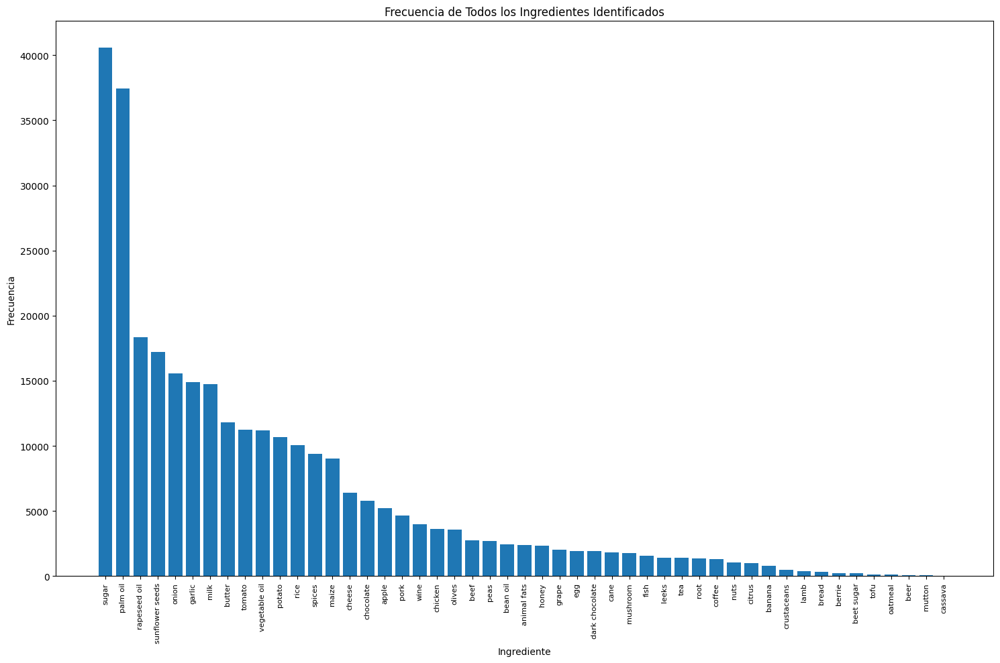

Frecuencia del número de ingredientes por producto:
    Número de Ingredientes  Frecuencia
0                        0       33288
1                        1       13742
2                        2        9876
3                        3        8293
4                        4        6838
5                        5        6358
6                        6        5885
7                        7        5218
8                        8        4308
9                        9        2939
10                      10        2226
11                      11         977
12                      12         506
13                      13         338
14                      14         212
15                      15          79
17                      16          25
16                      17          33
18                      18          19
19                      19           4
21                      20           1
20                      22           1
El archivo 'frecuencia_ingredientes_por_producto.cs

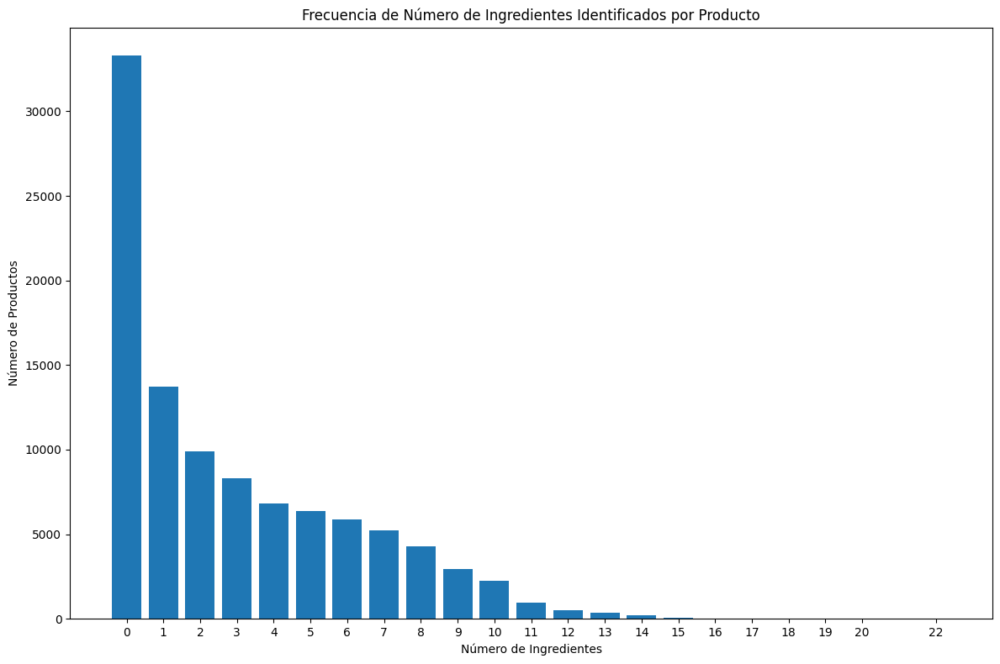

In [10]:
import pandas as pd
import re
import json
import matplotlib.pyplot as plt

# Cargar ingredientes normalizados
ingredientes_totales = pd.read_csv("ingredientes+huella.csv", usecols=["ingredient_normalized"], sep=";")

# Agregar nuevos ingredientes normalizados adicionales
ingredientes_adicionales = [
    "garlic", "sugar", "spices", "chocolate", "mushroom", "parsle", "vegetable oil", "honey"
]
ingredientes_totales = pd.concat([
    ingredientes_totales,
    pd.DataFrame({"ingredient_normalized": ingredientes_adicionales})
], ignore_index=True)

# Crear un diccionario de mapeo de sinónimos o ingredientes vinculados
ingredientes_vinculados = {
    "glucose": "sugar",
    "dextrose": "sugar",
    "maltodextrin": "sugar",
    "wheatflour": "bread",
    "flour": "bread",
    "wheatstarch": "bread",
    "cornflour": "maize",
    "cocoa": "chocolate",
    "yeast": "mushroom",
    "black pepper": "spices",
    "cheddar": "cheese",
    "sweeteners": "sugar"
}

# Cargar productos
file_path = '../data/raw/products_utf8.csv'
productos = pd.read_csv(file_path, usecols=["ingredients_text"], encoding='utf-8')

# Limpiar y estandarizar la lista de ingredientes normalizados
def normalizar_ingrediente(ingrediente):
    ingrediente = ingrediente.lower().strip()
    ingrediente = re.sub(r'[^\w\s]', '', ingrediente)  # Eliminar caracteres especiales
    return ingrediente

ingredientes_set = set(
    ingredientes_totales['ingredient_normalized']
    .dropna()
    .apply(normalizar_ingrediente)
)

# Función para manejar nombres compuestos, plurales y reglas "es"
def singular_plural_compound_match(palabra, ingredientes_set):
    palabra = palabra.lower().strip()  # Asegurarse de manejar mayúsculas/minúsculas
    if palabra in ingredientes_set:
        return palabra
    elif palabra.endswith('s') and palabra[:-1] in ingredientes_set:
        return palabra[:-1]  # Singular
    elif palabra + 's' in ingredientes_set:
        return palabra + 's'  # Plural
    elif palabra.endswith('es') and palabra[:-2] in ingredientes_set:
        return palabra[:-2]  # Reglas "es" (tomatoes -> tomato)
    elif palabra + 'es' in ingredientes_set:
        return palabra + 'es'  # Plural con "es"
    else:
        for ingrediente in ingredientes_set:
            if palabra in ingrediente.split():  # Verificar palabras compuestas
                return ingrediente
    return None

# Función para extraer ingredientes con porcentaje y normalizar
def extraer_ingrediente_con_porcentaje(texto):
    matches = re.findall(r'(\w+(?:\s\w+)*)\s*\((\d+\%)\)', texto)
    return [{"ingrediente": normalizar_ingrediente(match[0]), "porcentaje": match[1]} for match in matches]

# Función para buscar ingredientes en el texto ambiguo
def identificar_ingredientes(texto, ingredientes_set):
    if pd.isna(texto):
        return []
    texto = texto.lower()
    texto = re.sub(r'[^\w\s,;:]', '', texto)  # Limpiar caracteres no deseados
    palabras = re.split(r'[ ,;:]', texto)  # Separar por delimitadores
    ingredientes_encontrados = [
        singular_plural_compound_match(palabra.strip(), ingredientes_set)
        for palabra in palabras
        if singular_plural_compound_match(palabra.strip(), ingredientes_set)
    ]
    # Aplicar mapeo de ingredientes vinculados
    ingredientes_mapeados = [
        ingredientes_vinculados.get(ing, ing) for ing in ingredientes_encontrados
    ]
    return list(set(ingredientes_mapeados))  # Eliminar duplicados

# Aplicar las funciones a toda la base de datos
productos['ingredientes_identificados'] = productos['ingredients_text'].apply(
    lambda x: identificar_ingredientes(x, ingredientes_set)
)
productos['ingredientes_con_porcentaje'] = productos['ingredients_text'].apply(
    lambda x: extraer_ingrediente_con_porcentaje(x) if isinstance(x, str) else []
)

# Seleccionar columnas relevantes
resultado = productos[['ingredients_text', 'ingredientes_identificados', 'ingredientes_con_porcentaje']]

# Guardar el resultado en un archivo JSON
resultado_json = resultado.to_json(orient='records', indent=2, force_ascii=False)
with open("productos_ingredientes_identificados_v8.json", "w", encoding="utf-8") as file:
    file.write(resultado_json)

# Confirmación y muestra de ejemplo
print("El archivo 'productos_ingredientes_identificados_v8.json' ha sido generado con éxito.")
print(resultado.head())

# Cargar el archivo JSON generado previamente
with open("productos_ingredientes_identificados_v8.json", "r", encoding="utf-8") as file:
    data = json.load(file)

# Convertir a un DataFrame
df = pd.DataFrame(data)

# Aplanar la lista de ingredientes identificados en una sola lista
ingredientes_lista = df['ingredientes_identificados'].explode()

# Calcular las frecuencias de cada ingrediente
frecuencias = ingredientes_lista.value_counts().reset_index()
frecuencias.columns = ['Ingrediente', 'Frecuencia']

# Mostrar el número total de ingredientes identificados y una muestra
print(f"Total de ingredientes identificados: {frecuencias.shape[0]}")
print(frecuencias.head())

# Guardar las frecuencias en un archivo CSV
frecuencias.to_csv("frecuencia_ingredientes.csv", index=False)
print("El archivo 'frecuencia_ingredientes.csv' ha sido generado con éxito.")

# Crear un diagrama de barras con todas las frecuencias
plt.figure(figsize=(15, 10))
plt.bar(frecuencias['Ingrediente'], frecuencias['Frecuencia'])
plt.xticks(rotation=90, fontsize=8)
plt.title("Frecuencia de Todos los Ingredientes Identificados")
plt.xlabel("Ingrediente")
plt.ylabel("Frecuencia")
plt.tight_layout()
plt.show()

# Calcular el número de ingredientes identificados por producto
df['num_ingredientes'] = df['ingredientes_identificados'].apply(lambda x: len(x))

# Calcular las frecuencias del número de ingredientes
frecuencia_productos = df['num_ingredientes'].value_counts().reset_index()
frecuencia_productos.columns = ['Número de Ingredientes', 'Frecuencia']
frecuencia_productos = frecuencia_productos.sort_values(by='Número de Ingredientes')

# Mostrar la tabla de frecuencias
print("Frecuencia del número de ingredientes por producto:")
print(frecuencia_productos)

# Guardar las frecuencias en un archivo CSV
frecuencia_productos.to_csv("frecuencia_ingredientes_por_producto.csv", index=False)
print("El archivo 'frecuencia_ingredientes_por_producto.csv' ha sido generado con éxito.")

# Crear un diagrama de barras
plt.figure(figsize=(12, 8))
plt.bar(frecuencia_productos['Número de Ingredientes'], frecuencia_productos['Frecuencia'])
plt.title("Frecuencia de Número de Ingredientes Identificados por Producto")
plt.xlabel("Número de Ingredientes")
plt.ylabel("Número de Productos")
plt.xticks(frecuencia_productos['Número de Ingredientes'])
plt.tight_layout()
plt.show()


El archivo 'productos_ingredientes_identificados_v9.json' ha sido generado con éxito.
              ingredients_text ingredientes_identificados  \
0                      Cheddar                   [cheese]   
1  Butter (Milk), Salt (1.5%).             [milk, butter]   
2               Salmon (Fish).                     [fish]   
3         Clementine, Mandarin                         []   
4                      Avocado                         []   

  ingredientes_con_porcentaje  
0                          []  
1                          []  
2                          []  
3                          []  
4                          []  
Total de ingredientes identificados: 49
       Ingrediente  Frecuencia
0            sugar       46499
1         palm oil       37423
2            bread       24801
3     rapeseed oil       18329
4  sunflower seeds       17198
El archivo 'frecuencia_ingredientes.csv' ha sido generado con éxito.


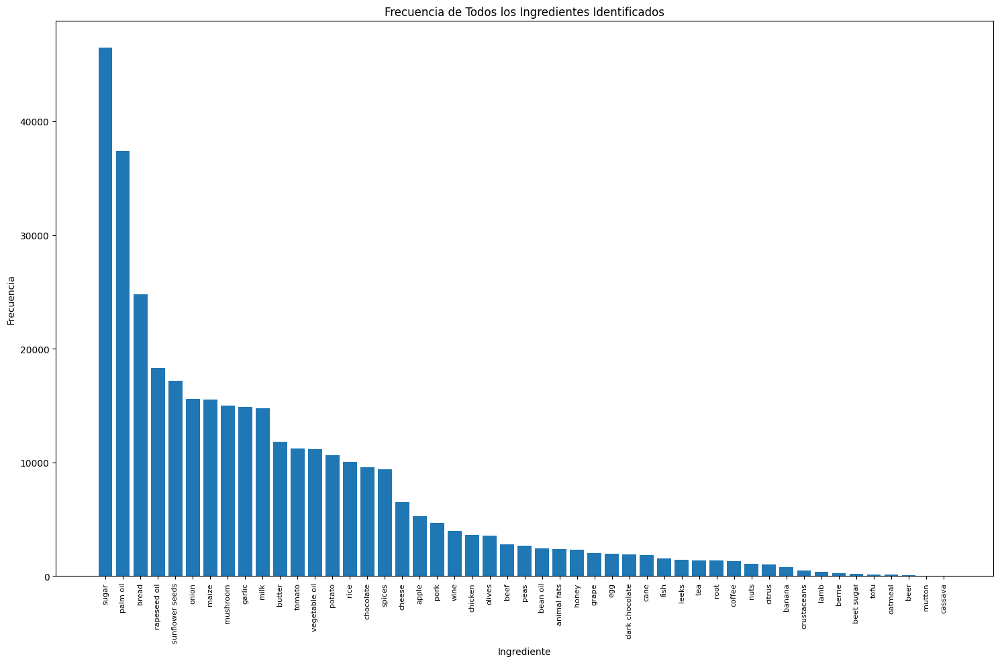

Frecuencia del número de ingredientes por producto:
    Número de Ingredientes  Frecuencia
0                        0       30338
1                        1       14437
2                        2        8831
3                        3        6892
4                        4        6284
6                        5        5853
5                        6        5886
7                        7        5279
8                        8        4807
9                        9        3587
10                      10        3307
11                      11        2277
12                      12        1479
13                      13         794
14                      14         478
15                      15         304
16                      16         159
17                      17         102
18                      18          33
19                      19          27
20                      20           6
21                      21           5
22                      25           1
El archivo '

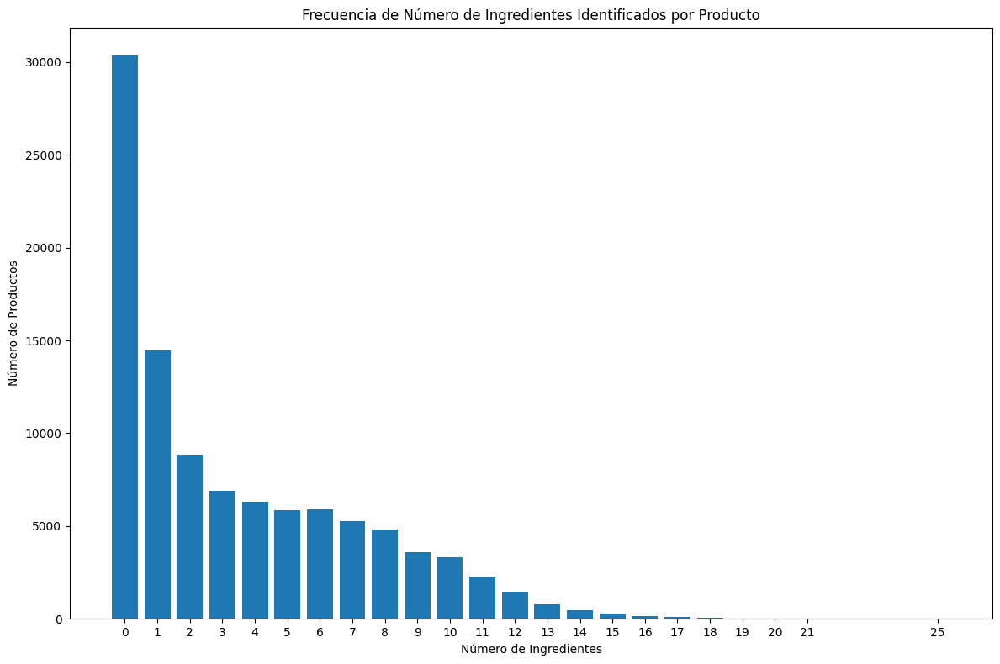

In [11]:
import pandas as pd
import re
import json
import matplotlib.pyplot as plt

# Cargar ingredientes normalizados
ingredientes_totales = pd.read_csv("ingredientes+huella.csv", usecols=["ingredient_normalized"], sep=";")

# Agregar nuevos ingredientes normalizados adicionales
ingredientes_adicionales = [
    "garlic", "sugar", "spices", "chocolate", "mushroom", "parsle", "vegetable oil", "honey"
]
ingredientes_totales = pd.concat([
    ingredientes_totales,
    pd.DataFrame({"ingredient_normalized": ingredientes_adicionales})
], ignore_index=True)

# Crear un diccionario de mapeo de sinónimos o ingredientes vinculados
ingredientes_vinculados = {
    "glucose": "sugar",
    "dextrose": "sugar",
    "maltodextrin": "sugar",
    "wheatflour": "bread",
    "flour": "bread",
    "wheatstarch": "bread",
    "cornflour": "maize",
    "cocoa": "chocolate",
    "yeast": "mushroom",
    "black pepper": "spices",
    "cheddar": "cheese",
    "sweeteners": "sugar"
}

# Cargar productos
file_path = '../data/raw/products_utf8.csv'
productos = pd.read_csv(file_path, usecols=["ingredients_text"], encoding='utf-8')

# Limpiar y estandarizar la lista de ingredientes normalizados
def normalizar_ingrediente(ingrediente):
    ingrediente = ingrediente.lower().strip()
    ingrediente = re.sub(r'[^\w\s]', '', ingrediente)  # Eliminar caracteres especiales
    return ingrediente

ingredientes_set = set(
    ingredientes_totales['ingredient_normalized']
    .dropna()
    .apply(normalizar_ingrediente)
)

# Función para manejar nombres compuestos, plurales y reglas "es"
def singular_plural_compound_match(palabra, ingredientes_set):
    palabra = palabra.lower().strip()  # Asegurarse de manejar mayúsculas/minúsculas
    if palabra in ingredientes_set:
        return palabra
    elif palabra.endswith('s') and palabra[:-1] in ingredientes_set:
        return palabra[:-1]  # Singular
    elif palabra + 's' in ingredientes_set:
        return palabra + 's'  # Plural
    elif palabra.endswith('es') and palabra[:-2] in ingredientes_set:
        return palabra[:-2]  # Reglas "es" (tomatoes -> tomato)
    elif palabra + 'es' in ingredientes_set:
        return palabra + 'es'  # Plural con "es"
    else:
        for ingrediente in ingredientes_set:
            if palabra in ingrediente.split():  # Verificar palabras compuestas
                return ingrediente
    return None

# Función para buscar en ingredientes vinculados
def mapear_a_vinculados(palabra):
    palabra = palabra.lower().strip()
    if palabra in ingredientes_vinculados:
        return ingredientes_vinculados[palabra]
    elif palabra.endswith('s') and palabra[:-1] in ingredientes_vinculados:
        return ingredientes_vinculados[palabra[:-1]]  # Singular
    elif palabra.endswith('es') and palabra[:-2] in ingredientes_vinculados:
        return ingredientes_vinculados[palabra[:-2]]  # Reglas "es"
    return None

# Función para buscar ingredientes en el texto ambiguo
def identificar_ingredientes(texto, ingredientes_set):
    if pd.isna(texto):
        return []
    texto = texto.lower()
    texto = re.sub(r'[^\w\s,;:]', '', texto)  # Limpiar caracteres no deseados
    palabras = re.split(r'[ ,;:]', texto)  # Separar por delimitadores

    ingredientes_identificados = []

    for palabra in palabras:
        palabra = palabra.strip()
        # Primero, buscar en los ingredientes normalizados
        normalizado = singular_plural_compound_match(palabra, ingredientes_set)
        if normalizado:
            ingredientes_identificados.append(normalizado)
            continue

        # Luego, buscar en ingredientes vinculados
        vinculado = mapear_a_vinculados(palabra)
        if vinculado:
            ingredientes_identificados.append(vinculado)
            continue

    return list(set(ingredientes_identificados))  # Eliminar duplicados

# Aplicar las funciones a toda la base de datos
productos['ingredientes_identificados'] = productos['ingredients_text'].apply(
    lambda x: identificar_ingredientes(x, ingredientes_set)
)
productos['ingredientes_con_porcentaje'] = productos['ingredients_text'].apply(
    lambda x: extraer_ingrediente_con_porcentaje(x) if isinstance(x, str) else []
)

# Seleccionar columnas relevantes
resultado = productos[['ingredients_text', 'ingredientes_identificados', 'ingredientes_con_porcentaje']]

# Guardar el resultado en un archivo JSON
resultado_json = resultado.to_json(orient='records', indent=2, force_ascii=False)
with open("productos_ingredientes_identificados_v9.json", "w", encoding="utf-8") as file:
    file.write(resultado_json)

# Confirmación y muestra de ejemplo
print("El archivo 'productos_ingredientes_identificados_v9.json' ha sido generado con éxito.")
print(resultado.head())

# Cargar el archivo JSON generado previamente
with open("productos_ingredientes_identificados_v9.json", "r", encoding="utf-8") as file:
    data = json.load(file)

# Convertir a un DataFrame
df = pd.DataFrame(data)

# Aplanar la lista de ingredientes identificados en una sola lista
ingredientes_lista = df['ingredientes_identificados'].explode()

# Calcular las frecuencias de cada ingrediente
frecuencias = ingredientes_lista.value_counts().reset_index()
frecuencias.columns = ['Ingrediente', 'Frecuencia']

# Mostrar el número total de ingredientes identificados y una muestra
print(f"Total de ingredientes identificados: {frecuencias.shape[0]}")
print(frecuencias.head())

# Guardar las frecuencias en un archivo CSV
frecuencias.to_csv("frecuencia_ingredientes.csv", index=False)
print("El archivo 'frecuencia_ingredientes.csv' ha sido generado con éxito.")

# Crear un diagrama de barras con todas las frecuencias
plt.figure(figsize=(15, 10))
plt.bar(frecuencias['Ingrediente'], frecuencias['Frecuencia'])
plt.xticks(rotation=90, fontsize=8)
plt.title("Frecuencia de Todos los Ingredientes Identificados")
plt.xlabel("Ingrediente")
plt.ylabel("Frecuencia")
plt.tight_layout()
plt.show()

# Calcular el número de ingredientes identificados por producto
df['num_ingredientes'] = df['ingredientes_identificados'].apply(lambda x: len(x))

# Calcular las frecuencias del número de ingredientes
frecuencia_productos = df['num_ingredientes'].value_counts().reset_index()
frecuencia_productos.columns = ['Número de Ingredientes', 'Frecuencia']
frecuencia_productos = frecuencia_productos.sort_values(by='Número de Ingredientes')

# Mostrar la tabla de frecuencias
print("Frecuencia del número de ingredientes por producto:")
print(frecuencia_productos)

# Guardar las frecuencias en un archivo CSV
frecuencia_productos.to_csv("frecuencia_ingredientes_por_producto.csv", index=False)
print("El archivo 'frecuencia_ingredientes_por_producto.csv' ha sido generado con éxito.")

# Crear un diagrama de barras
plt.figure(figsize=(12, 8))
plt.bar(frecuencia_productos['Número de Ingredientes'], frecuencia_productos['Frecuencia'])
plt.title("Frecuencia de Número de Ingredientes Identificados por Producto")
plt.xlabel("Número de Ingredientes")
plt.ylabel("Número de Productos")
plt.xticks(frecuencia_productos['Número de Ingredientes'])
plt.tight_layout()
plt.show()


El archivo 'productos_ingredientes_identificados_v9.json' y 'productos_ingredientes_identificados_v9.csv' han sido generados con éxito.
              ingredients_text ingredientes_identificados  \
0                      Cheddar                   [cheese]   
1  Butter (Milk), Salt (1.5%).             [milk, butter]   
2               Salmon (Fish).                     [fish]   
3         Clementine, Mandarin                         []   
4                      Avocado                         []   

  ingredientes_con_porcentaje  
0                          []  
1                          []  
2                          []  
3                          []  
4                          []  
Total de ingredientes identificados: 49
       Ingrediente  Frecuencia
0            sugar       46499
1         palm oil       37423
2            bread       24801
3     rapeseed oil       18329
4  sunflower seeds       17198
El archivo 'frecuencia_ingredientes.csv' ha sido generado con éxito.


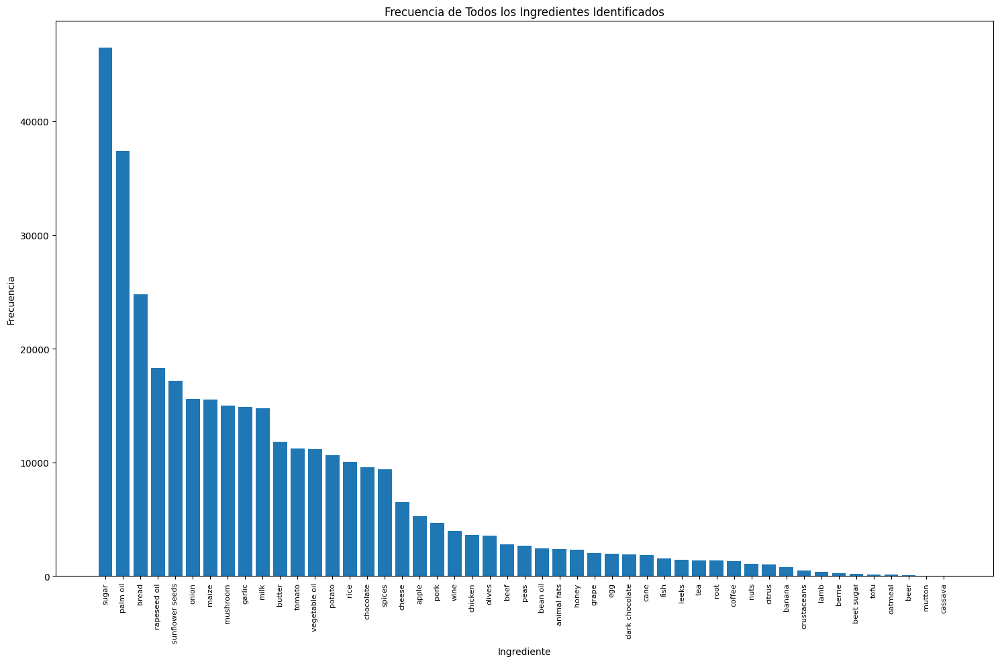

Frecuencia del número de ingredientes por producto:
    Número de Ingredientes  Frecuencia
0                        0       30338
1                        1       14437
2                        2        8831
3                        3        6892
4                        4        6284
6                        5        5853
5                        6        5886
7                        7        5279
8                        8        4807
9                        9        3587
10                      10        3307
11                      11        2277
12                      12        1479
13                      13         794
14                      14         478
15                      15         304
16                      16         159
17                      17         102
18                      18          33
19                      19          27
20                      20           6
21                      21           5
22                      25           1
El archivo '

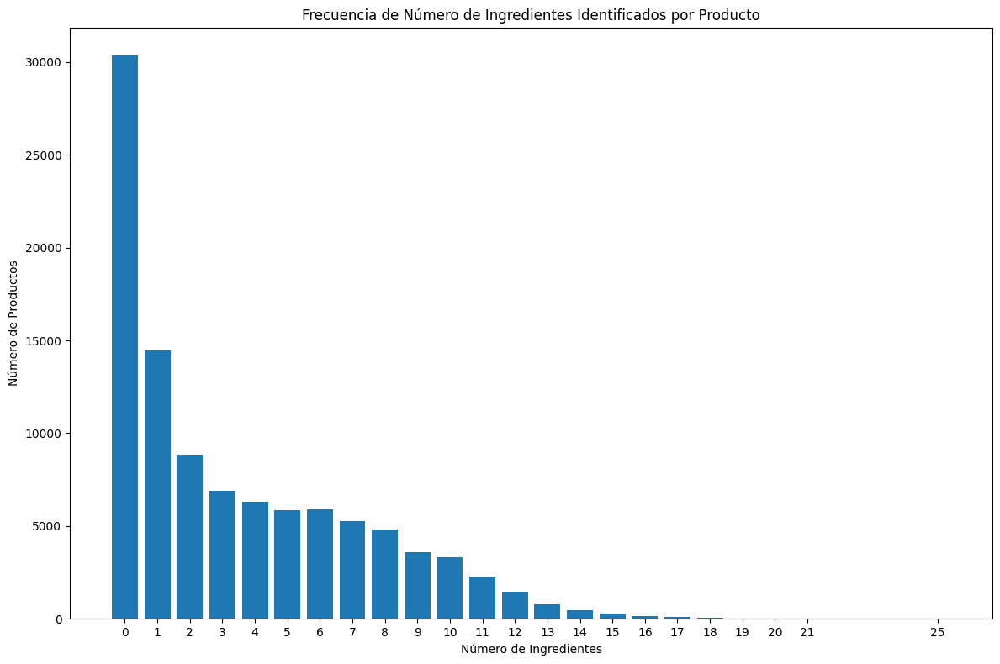

In [12]:
import pandas as pd
import re
import json
import matplotlib.pyplot as plt

# Cargar ingredientes normalizados
ingredientes_totales = pd.read_csv("ingredientes+huella.csv", usecols=["ingredient_normalized"], sep=";")

# Agregar nuevos ingredientes normalizados adicionales
ingredientes_adicionales = [
    "garlic", "sugar", "spices", "chocolate", "mushroom", "parsle", "vegetable oil", "honey"
]
ingredientes_totales = pd.concat([
    ingredientes_totales,
    pd.DataFrame({"ingredient_normalized": ingredientes_adicionales})
], ignore_index=True)

# Crear un diccionario de mapeo de sinónimos o ingredientes vinculados
ingredientes_vinculados = {
    "glucose": "sugar",
    "dextrose": "sugar",
    "maltodextrin": "sugar",
    "wheatflour": "bread",
    "flour": "bread",
    "wheatstarch": "bread",
    "cornflour": "maize",
    "cocoa": "chocolate",
    "yeast": "mushroom",
    "black pepper": "spices",
    "cheddar": "cheese",
    "sweetener": "sugar"
}

# Cargar productos
file_path = '../data/raw/products_utf8.csv'
productos = pd.read_csv(file_path, usecols=["ingredients_text"], encoding='utf-8')

# Limpiar y estandarizar la lista de ingredientes normalizados
def normalizar_ingrediente(ingrediente):
    ingrediente = ingrediente.lower().strip()
    ingrediente = re.sub(r'[^\w\s]', '', ingrediente)  # Eliminar caracteres especiales
    return ingrediente

ingredientes_set = set(
    ingredientes_totales['ingredient_normalized']
    .dropna()
    .apply(normalizar_ingrediente)
)

# Función para manejar nombres compuestos, plurales y reglas "es"
def singular_plural_compound_match(palabra, ingredientes_set):
    palabra = palabra.lower().strip()  # Asegurarse de manejar mayúsculas/minúsculas
    if palabra in ingredientes_set:
        return palabra
    elif palabra.endswith('s') and palabra[:-1] in ingredientes_set:
        return palabra[:-1]  # Singular
    elif palabra + 's' in ingredientes_set:
        return palabra + 's'  # Plural
    elif palabra.endswith('es') and palabra[:-2] in ingredientes_set:
        return palabra[:-2]  # Reglas "es" (tomatoes -> tomato)
    elif palabra + 'es' in ingredientes_set:
        return palabra + 'es'  # Plural con "es"
    else:
        for ingrediente in ingredientes_set:
            if palabra in ingrediente.split():  # Verificar palabras compuestas
                return ingrediente
    return None

# Función para buscar en ingredientes vinculados
def mapear_a_vinculados(palabra):
    palabra = palabra.lower().strip()
    if palabra in ingredientes_vinculados:
        return ingredientes_vinculados[palabra]
    elif palabra.endswith('s') and palabra[:-1] in ingredientes_vinculados:
        return ingredientes_vinculados[palabra[:-1]]  # Singular
    elif palabra.endswith('es') and palabra[:-2] in ingredientes_vinculados:
        return ingredientes_vinculados[palabra[:-2]]  # Reglas "es"
    return None

# Función para buscar ingredientes en el texto ambiguo
def identificar_ingredientes(texto, ingredientes_set):
    if pd.isna(texto):
        return []
    texto = texto.lower()
    texto = re.sub(r'[^\w\s,;:]', '', texto)  # Limpiar caracteres no deseados
    palabras = re.split(r'[ ,;:]', texto)  # Separar por delimitadores

    ingredientes_identificados = []

    for palabra in palabras:
        palabra = palabra.strip()
        # Primero, buscar en los ingredientes normalizados
        normalizado = singular_plural_compound_match(palabra, ingredientes_set)
        if normalizado:
            ingredientes_identificados.append(normalizado)
            continue

        # Luego, buscar en ingredientes vinculados
        vinculado = mapear_a_vinculados(palabra)
        if vinculado:
            ingredientes_identificados.append(vinculado)
            continue

    return list(set(ingredientes_identificados))  # Eliminar duplicados

# Aplicar las funciones a toda la base de datos
productos['ingredientes_identificados'] = productos['ingredients_text'].apply(
    lambda x: identificar_ingredientes(x, ingredientes_set)
)
productos['ingredientes_con_porcentaje'] = productos['ingredients_text'].apply(
    lambda x: extraer_ingrediente_con_porcentaje(x) if isinstance(x, str) else []
)

# Seleccionar columnas relevantes
resultado = productos[['ingredients_text', 'ingredientes_identificados', 'ingredientes_con_porcentaje']]

# Guardar el resultado en un archivo JSON
resultado_json = resultado.to_json(orient='records', indent=2, force_ascii=False)
with open("productos_ingredientes_identificados_v9.json", "w", encoding="utf-8") as file:
    file.write(resultado_json)

# Guardar el resultado en un archivo CSV
resultado.to_csv("productos_ingredientes_identificados_v9.csv", index=False, encoding="utf-8")

# Confirmación y muestra de ejemplo
print("El archivo 'productos_ingredientes_identificados_v9.json' y 'productos_ingredientes_identificados_v9.csv' han sido generados con éxito.")
print(resultado.head())

# Cargar el archivo JSON generado previamente
with open("productos_ingredientes_identificados_v9.json", "r", encoding="utf-8") as file:
    data = json.load(file)

# Convertir a un DataFrame
df = pd.DataFrame(data)

# Aplanar la lista de ingredientes identificados en una sola lista
ingredientes_lista = df['ingredientes_identificados'].explode()

# Calcular las frecuencias de cada ingrediente
frecuencias = ingredientes_lista.value_counts().reset_index()
frecuencias.columns = ['Ingrediente', 'Frecuencia']

# Mostrar el número total de ingredientes identificados y una muestra
print(f"Total de ingredientes identificados: {frecuencias.shape[0]}")
print(frecuencias.head())

# Guardar las frecuencias en un archivo CSV
frecuencias.to_csv("frecuencia_ingredientes.csv", index=False)
print("El archivo 'frecuencia_ingredientes.csv' ha sido generado con éxito.")

# Crear un diagrama de barras con todas las frecuencias
plt.figure(figsize=(15, 10))
plt.bar(frecuencias['Ingrediente'], frecuencias['Frecuencia'])
plt.xticks(rotation=90, fontsize=8)
plt.title("Frecuencia de Todos los Ingredientes Identificados")
plt.xlabel("Ingrediente")
plt.ylabel("Frecuencia")
plt.tight_layout()
plt.show()

# Calcular el número de ingredientes identificados por producto
df['num_ingredientes'] = df['ingredientes_identificados'].apply(lambda x: len(x))

# Calcular las frecuencias del número de ingredientes
frecuencia_productos = df['num_ingredientes'].value_counts().reset_index()
frecuencia_productos.columns = ['Número de Ingredientes', 'Frecuencia']
frecuencia_productos = frecuencia_productos.sort_values(by='Número de Ingredientes')

# Mostrar la tabla de frecuencias
print("Frecuencia del número de ingredientes por producto:")
print(frecuencia_productos)

# Guardar las frecuencias en un archivo CSV
frecuencia_productos.to_csv("frecuencia_ingredientes_por_producto.csv", index=False)
print("El archivo 'frecuencia_ingredientes_por_producto.csv' ha sido generado con éxito.")

# Crear un diagrama de barras
plt.figure(figsize=(12, 8))
plt.bar(frecuencia_productos['Número de Ingredientes'], frecuencia_productos['Frecuencia'])
plt.title("Frecuencia de Número de Ingredientes Identificados por Producto")
plt.xlabel("Número de Ingredientes")
plt.ylabel("Número de Productos")
plt.xticks(frecuencia_productos['Número de Ingredientes'])
plt.tight_layout()
plt.show()


SCRIPTS PARA INGREDIENTES NO IDENTIFICADOS

In [13]:
import pandas as pd
import json
from collections import Counter
import re

# Carga del archivo CSV
data = pd.read_csv('productos_ingredientes_identificados_v9.csv')

# Función para limpiar y descomponer los ingredientes

def clean_and_split(text):
    text = re.sub(r'[,:;()\[\]."]', '', text)  # Elimina puntuación
    text = re.sub(r'\s+', ' ', text).strip()    # Elimina espacios extra
    return [word.lower() for word in text.split()]

# Conteo de palabras no identificadas
not_identified_counter = Counter()

for _, row in data.iterrows():
    try:
        ingredients_text = clean_and_split(row['ingredients_text'])
        identified = json.loads(row['ingredientes_identificados'])
        identified_lower = [item.lower() for item in identified]

        for word in ingredients_text:
            if word not in identified_lower:
                not_identified_counter[word] += 1
    except Exception as e:
        print(f"Error processing row: {e}")

# Crear un JSON con las palabras no identificadas y sus frecuencias
not_identified_json = {word: count for word, count in not_identified_counter.items()}

# Guardar el resultado en un archivo JSON
with open('not_identified_words_frequency.json', 'w') as outfile:
    json.dump(not_identified_json, outfile, indent=4)

print("Análisis completado. Los resultados se han guardado en 'not_identified_words_frequency.json'.")


Error processing row: Expecting value: line 1 column 2 (char 1)
Error processing row: Expecting value: line 1 column 2 (char 1)
Error processing row: Expecting value: line 1 column 2 (char 1)
Error processing row: Expecting value: line 1 column 2 (char 1)
Error processing row: expected string or bytes-like object, got 'float'
Error processing row: Expecting value: line 1 column 2 (char 1)
Error processing row: Expecting value: line 1 column 2 (char 1)
Error processing row: expected string or bytes-like object, got 'float'
Error processing row: Expecting value: line 1 column 2 (char 1)
Error processing row: expected string or bytes-like object, got 'float'
Error processing row: expected string or bytes-like object, got 'float'
Error processing row: expected string or bytes-like object, got 'float'
Error processing row: Expecting value: line 1 column 2 (char 1)
Error processing row: Expecting value: line 1 column 2 (char 1)
Error processing row: Expecting value: line 1 column 2 (char 1)


Error processing row: Expecting value: line 1 column 2 (char 1)
Error processing row: Expecting value: line 1 column 2 (char 1)
Error processing row: Expecting value: line 1 column 2 (char 1)
Error processing row: Expecting value: line 1 column 2 (char 1)
Error processing row: expected string or bytes-like object, got 'float'
Error processing row: Expecting value: line 1 column 2 (char 1)
Error processing row: Expecting value: line 1 column 2 (char 1)
Error processing row: expected string or bytes-like object, got 'float'
Error processing row: Expecting value: line 1 column 2 (char 1)
Error processing row: expected string or bytes-like object, got 'float'
Error processing row: expected string or bytes-like object, got 'float'
Error processing row: expected string or bytes-like object, got 'float'
Error processing row: Expecting value: line 1 column 2 (char 1)
Error processing row: Expecting value: line 1 column 2 (char 1)
Error processing row: Expecting value: line 1 column 2 (char 1)


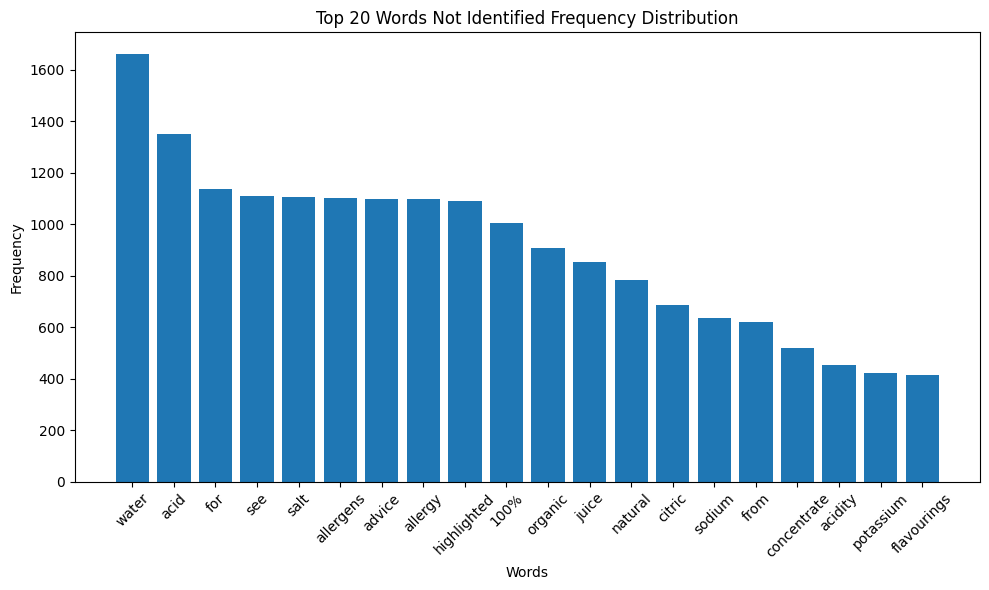

Análisis completado. Los resultados se han guardado en 'not_identified_words_frequency.csv', 'not_identified_words_frequency.json', y 'frequency_distribution.png'.


In [14]:
import pandas as pd
import json
from collections import Counter
import re
import matplotlib.pyplot as plt

# Carga del archivo CSV
data = pd.read_csv('productos_ingredientes_identificados_v9.csv')

# Función para limpiar y descomponer los ingredientes
def clean_and_split(text):
    text = re.sub(r'[,:;()\[\]."]', '', text)  # Elimina puntuación
    text = re.sub(r'\s+', ' ', text).strip()    # Elimina espacios extra
    return [word.lower() for word in text.split()]

# Conteo de palabras no identificadas
not_identified_counter = Counter()

for _, row in data.iterrows():
    try:
        ingredients_text = clean_and_split(row['ingredients_text'])
        identified = json.loads(row['ingredientes_identificados'])
        identified_lower = [item.lower() for item in identified]

        for word in ingredients_text:
            if word not in identified_lower:
                not_identified_counter[word] += 1
    except Exception as e:
        print(f"Error processing row: {e}")

# Crear un DataFrame con las palabras no identificadas y sus frecuencias
not_identified_df = pd.DataFrame(
    list(not_identified_counter.items()), columns=['word', 'frequency']
)
not_identified_df = not_identified_df.sort_values(by='frequency', ascending=False)

# Guardar el resultado en un archivo JSON y CSV
not_identified_df.to_csv('not_identified_words_frequency.csv', index=False)
with open('not_identified_words_frequency.json', 'w') as outfile:
    json.dump(not_identified_counter, outfile, indent=4)

# Graficar la distribución de frecuencias
plt.figure(figsize=(10, 6))
plt.bar(not_identified_df['word'][:20], not_identified_df['frequency'][:20])
plt.xlabel('Words')
plt.ylabel('Frequency')
plt.title('Top 20 Words Not Identified Frequency Distribution')
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig('frequency_distribution.png')
plt.show()

print("Análisis completado. Los resultados se han guardado en 'not_identified_words_frequency.csv', 'not_identified_words_frequency.json', y 'frequency_distribution.png'.")


Volvemos al código

In [3]:
import pandas as pd
import re
import json
import matplotlib.pyplot as plt

# Cargar ingredientes normalizados
ingredientes_totales = pd.read_csv("ingredientes+huella.csv", usecols=["ingredient_normalized"], sep=";")

# Agregar nuevos ingredientes normalizados adicionales
ingredientes_adicionales = [
    "garlic", "sugar", "spices", "chocolate", "mushroom", "parsle", "vegetable oil", "honey",
    "coconut", "bean", "pineapple", "mango", "avocado", "vinegar", "spinach", "broccoli",
    "ginger", "pear", "lettuce", "melon", "peach", "cabbage", "mint", "prunes", "quinoa"
]
ingredientes_totales = pd.concat([
    ingredientes_totales,
    pd.DataFrame({"ingredient_normalized": ingredientes_adicionales})
], ignore_index=True)

# Crear un diccionario de mapeo de sinónimos o ingredientes vinculados
ingredientes_vinculados = {
    "glucose": "sugar",
    "dextrose": "sugar",
    "maltodextrin": "sugar",
    "wheatflour": "bread",
    "flour": "bread",
    "wheatstarch": "bread",
    "cornflour": "maize",
    "cocoa": "chocolate",
    "yeast": "mushroom",
    "black pepper": "spices",
    "cheddar": "cheese",
    "sweeteners": "sugar",
    "orange": "citrus",
    "lemon": "citrus",
    "hop": "beer",
    "pepper": "spices",
    "fat": "animal fats",
    "carrot": "root",
    "yogurt": "milk",
    "ginger": "root",
    "paprika": "spices",
    "grapefruit": "grape",
    "strawberry": "berrie",
    "barley": "beer",
    "beetroot": "root",
    "lime": "citrus",
    "raspberry": "berrie",
    "corn": "maize",
    "cacao": "chocolate",
    "maltedbarley": "beer",
    "durum": "bread",
    "malt": "beer",
    "skimmedmilk": "milk",
    "parsley": "parsle",
    "cranberry": "berrie",
    "tuna": "fish",
    "sweetcorn": "maize",
    "watermelon": "melon",
    "peppercorn": "spices",
    "turkey": "chicken",
    "mandarin": "citrus",
    "rolledoat": "bread",
    "pomegranate": "berrie",
    "almonds": "nuts",
    "blackberry": "berrie",
    "blueberries": "berrie",
    "duck": "chicken",
    "goose": "chicken",
    "quail": "chicken"
}

# Cargar productos
file_path = '../data/raw/products_utf8.csv'
productos = pd.read_csv(file_path, usecols=["ingredients_text"], encoding='utf-8')

# Limpiar y estandarizar la lista de ingredientes normalizados
def normalizar_ingrediente(ingrediente):
    ingrediente = ingrediente.lower().strip()
    ingrediente = re.sub(r'[^\w\s]', '', ingrediente)  # Eliminar caracteres especiales
    return ingrediente

ingredientes_set = set(
    ingredientes_totales['ingredient_normalized']
    .dropna()
    .apply(normalizar_ingrediente)
)

# Función para manejar nombres compuestos, plurales y reglas "es"
def singular_plural_compound_match(palabra, ingredientes_set):
    palabra = palabra.lower().strip()  # Asegurarse de manejar mayúsculas/minúsculas
    if palabra in ingredientes_set:
        return palabra
    elif palabra.endswith('s') and palabra[:-1] in ingredientes_set:
        return palabra[:-1]  # Singular
    elif palabra + 's' in ingredientes_set:
        return palabra + 's'  # Plural
    elif palabra.endswith('es') and palabra[:-2] in ingredientes_set:
        return palabra[:-2]  # Reglas "es" (tomatoes -> tomato)
    elif palabra + 'es' in ingredientes_set:
        return palabra + 'es'  # Plural con "es"
    else:
        for ingrediente in ingredientes_set:
            if palabra in ingrediente.split():  # Verificar palabras compuestas
                return ingrediente
    return None

# Función para buscar en ingredientes vinculados
def mapear_a_vinculados(palabra):
    palabra = palabra.lower().strip()
    if palabra in ingredientes_vinculados:
        return ingredientes_vinculados[palabra]
    elif palabra.endswith('s') and palabra[:-1] in ingredientes_vinculados:
        return ingredientes_vinculados[palabra[:-1]]  # Singular
    elif palabra.endswith('es') and palabra[:-2] in ingredientes_vinculados:
        return ingredientes_vinculados[palabra[:-2]]  # Reglas "es"
    return None

# Función para buscar ingredientes en el texto ambiguo
def identificar_ingredientes(texto, ingredientes_set):
    if pd.isna(texto):
        return []
    texto = texto.lower()
    texto = re.sub(r'[^\w\s,;:]', '', texto)  # Limpiar caracteres no deseados
    palabras = re.split(r'[ ,;:]', texto)  # Separar por delimitadores

    ingredientes_identificados = []

    for palabra in palabras:
        palabra = palabra.strip()
        # Primero, buscar en los ingredientes normalizados
        normalizado = singular_plural_compound_match(palabra, ingredientes_set)
        if normalizado:
            ingredientes_identificados.append(normalizado)
            continue

        # Luego, buscar en ingredientes vinculados
        vinculado = mapear_a_vinculados(palabra)
        if vinculado:
            ingredientes_identificados.append(vinculado)
            continue

    return list(set(ingredientes_identificados))  # Eliminar duplicados

# Aplicar las funciones a toda la base de datos
productos['ingredientes_identificados'] = productos['ingredients_text'].apply(
    lambda x: identificar_ingredientes(x, ingredientes_set)
)
productos['ingredientes_con_porcentaje'] = productos['ingredients_text'].apply(
    lambda x: extraer_ingrediente_con_porcentaje(x) if isinstance(x, str) else []
)

# Seleccionar columnas relevantes
resultado = productos[['ingredients_text', 'ingredientes_identificados', 'ingredientes_con_porcentaje']]

# Guardar el resultado en un archivo JSON
resultado_json = resultado.to_json(orient='records', indent=2, force_ascii=False)
with open("productos_ingredientes_identificados_v10.json", "w", encoding="utf-8") as file:
    file.write(resultado_json)

# Guardar el resultado en un archivo CSV
resultado.to_csv("productos_ingredientes_identificados_v10.csv", index=False, encoding="utf-8")

# Confirmación y muestra de ejemplo
print("El archivo 'productos_ingredientes_identificados_v10.json' y 'productos_ingredientes_identificados_v10.csv' han sido generados con éxito.")
print(resultado.head())

# Cargar el archivo JSON generado previamente
with open("productos_ingredientes_identificados_v10.json", "r", encoding="utf-8") as file:
    data = json.load(file)

# Convertir a un DataFrame
df = pd.DataFrame(data)

# Aplanar la lista de ingredientes identificados en una sola lista
ingredientes_lista = df['ingredientes_identificados'].explode()

# Calcular las frecuencias de cada ingrediente
frecuencias = ingredientes_lista.value_counts().reset_index()
frecuencias.columns = ['Ingrediente', 'Frecuencia']

# Mostrar el número total de ingredientes identificados y una muestra
print(f"Total de ingredientes identificados: {frecuencias.shape[0]}")
print(frecuencias.head())

# Guardar las frecuencias en un archivo CSV
frecuencias.to_csv("frecuencia_ingredientes.csv", index=False)
print("El archivo 'frecuencia_ingredientes.csv' ha sido generado con éxito.")

# Crear un diagrama de barras con todas las frecuencias
plt.figure(figsize=(15, 10))
plt.bar(frecuencias['Ingrediente'], frecuencias['Frecuencia'])
plt.xticks(rotation=90, fontsize=8)
plt.title("Frecuencia de Todos los Ingredientes Identificados")
plt.xlabel("Ingrediente")
plt.ylabel("Frecuencia")
plt.tight_layout()
plt.show()

# Calcular el número de ingredientes identificados por producto
df['num_ingredientes'] = df['ingredientes_identificados'].apply(lambda x: len(x))

# Calcular las frecuencias del número de ingredientes
frecuencia_productos = df['num_ingredientes'].value_counts().reset_index()
frecuencia_productos.columns = ['Número de Ingredientes', 'Frecuencia']
frecuencia_productos = frecuencia_productos.sort_values(by='Número de Ingredientes')

# Mostrar la tabla de frecuencias
print("Frecuencia del número de ingredientes por producto:")
print(frecuencia_productos)

# Guardar las frecuencias en un archivo CSV
frecuencia_productos.to_csv("frecuencia_ingredientes_por_producto.csv", index=False)
print("El archivo 'frecuencia_ingredientes_por_producto.csv' ha sido generado con éxito.")

# Crear un diagrama de barras
plt.figure(figsize=(12, 8))
plt.bar(frecuencia_productos['Número de Ingredientes'], frecuencia_productos['Frecuencia'])
plt.title("Frecuencia de Número de Ingredientes Identificados por Producto")
plt.xlabel("Número de Ingredientes")
plt.ylabel("Número de Productos")
plt.xticks(frecuencia_productos['Número de Ingredientes'])
plt.tight_layout()
plt.show()


ValueError: Usecols do not match columns, columns expected but not found: ['ingredient_normalized']

El archivo 'productos_ingredientes_identificados_v11.json' y 'productos_ingredientes_identificados_v11.csv' han sido generados con éxito.
              ingredients_text ingredientes_identificados  \
0                      Cheddar                   [cheese]   
1  Butter (Milk), Salt (1.5%).             [butter, milk]   
2               Salmon (Fish).                     [fish]   
3         Clementine, Mandarin                   [citrus]   
4                      Avocado                  [avocado]   

  ingredientes_con_porcentaje  
0                          []  
1                          []  
2                          []  
3                          []  
4                          []  
Total de ingredientes identificados: 68
  Ingrediente  Frecuencia
0       sugar       46499
1    palm oil       37423
2       bread       25799
3      spices       23406
4       maize       19336
El archivo 'frecuencia_ingredientes.csv' ha sido generado con éxito.


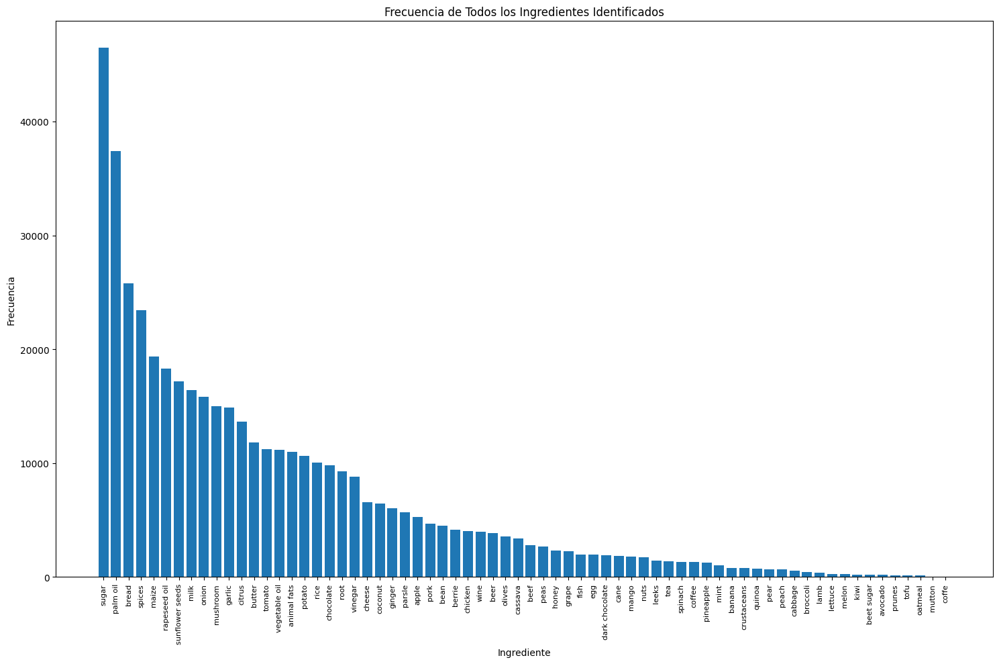

Frecuencia del número de ingredientes por producto:
    Número de Ingredientes  Frecuencia
0                        0       26426
1                        1       11774
2                        2        8899
3                        3        6849
4                        4        5832
5                        5        5491
6                        6        5305
7                        7        5085
8                        8        4736
9                        9        4190
10                      10        3814
11                      11        3401
12                      12        2267
13                      13        1950
14                      14        1716
15                      15         987
16                      16         747
17                      17         466
18                      18         342
19                      19         279
20                      20         272
21                      21         131
22                      22          81
23          

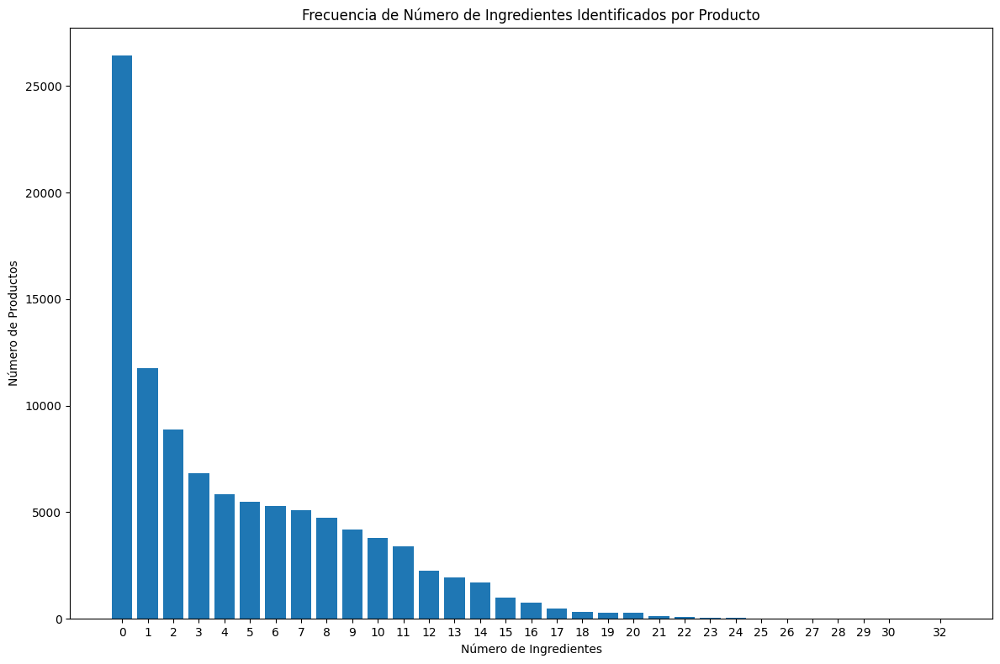

In [ ]:
import pandas as pd
import re
import json
import matplotlib.pyplot as plt

# Cargar ingredientes normalizados
ingredientes_totales = pd.read_csv("ingredientes+huella.csv", usecols=["ingredient_normalized"], sep=";")

# Agregar nuevos ingredientes normalizados adicionales
ingredientes_adicionales = [
    "garlic", "sugar", "spices", "chocolate", "mushroom", "parsley","vegetable oil",
    "coconut", "bean", "pineapple", "mango", "avocado","spinach", "broccoli",
    "ginger", "pear", "lettuce", "melon", "peach", "cabbage", "mint", "quinoa",
    "kiwi","chilli", "garlic powder"
]
ingredientes_totales = pd.concat([
    ingredientes_totales,
    pd.DataFrame({"ingredient_normalized": ingredientes_adicionales})
], ignore_index=True)

# Crear un diccionario de mapeo de sinónimos o ingredientes vinculados
ingredientes_vinculados = {
    "glucose": "sugar",
    "dextrose": "sugar",
    "maltodextrin": "sugar",
    "wheatflour": "bread",
    "flour": "bread",
    "wheatstarch": "bread",
    "cornflour": "maize",
    "cocoa": "chocolate",
    "yeast": "mushroom",
    "black pepper": "spices",
    "cheddar": "cheese",
    "sweeteners": "sugar",
    "orange": "citrus",
    "lemon": "citrus",
    "hop": "beer",
    "pepper": "spices",
    "fat": "animal fats",
    "carrot": "root",
    "yogurt": "milk",
    "yoghurt": "milk",
    "ginger": "root",
    "paprika": "spices",
    "grapefruit": "grape",
    "strawberry": "berrie",
    "barley": "beer",
    "beetroot": "root",
    "lime": "citrus",
    "raspberry": "berrie",
    "corn": "maize",
    "cacao": "chocolate",
    "maltedbarley": "beer",
    "durum": "bread",
    "malt": "beer",
    "skimmedmilk": "milk",
    "cranberry": "berrie",
    "tuna": "fish",
    "sweetcorn": "maize",
    "watermelon": "melon",
    "peppercorn": "spices",
    "turkey": "chicken",
    "mandarin": "citrus",
    "rolledoat": "bread",
    "pomegranate": "berrie",
    "almonds": "nuts",
    "blackberry": "berrie",
    "blueberries": "berrie",
    "duck": "chicken",
    "goose": "chicken",
    "quail": "chicken",
    "oat": "bread",
    "lard": "animal fats",
    "butterfat": "animal fats",
    "tapioca": "cassava",
    "mozzarella": "cheese",
    "brie": "cheese",
    "gouda": "cheese",
    "tangerine": "citrus",
    "espresso": "coffe",
    "shrimp": "crustaceans",
    "crab": "crustaceans",
    "lobster": "crustaceans",
    "prawn": "crustaceans",
    "cod": "fish",
    "trout": "fish",
    "sardine": "fish",
    "walnuts": "nuts",
    "cashew": "nuts",
    "pecans": "nuts",
    "pistachio": "nuts",
    "shallot": "onion",
    "radish": "root",
    "parsnip": "root",
    "fowl": "chicken",
    "partridge": "chicken",
    "mackerel": "fish",
    "haddock": "fish",
    "clove": "spices",
    "halibut": "fish",
    "fructose":"sugar",
    "chillies":"chilli",
    "pasta": "bread"
}

# Cargar productos
file_path = '../data/raw/products_utf8.csv'
productos = pd.read_csv(file_path, usecols=["ingredients_text"], encoding='utf-8')

# Limpiar y estandarizar la lista de ingredientes normalizados
def normalizar_ingrediente(ingrediente):
    ingrediente = ingrediente.lower().strip()
    ingrediente = re.sub(r'[^\w\s]', '', ingrediente)  # Eliminar caracteres especiales
    return ingrediente

ingredientes_set = set(
    ingredientes_totales['ingredient_normalized']
    .dropna()
    .apply(normalizar_ingrediente)
)

# Función para manejar nombres compuestos, plurales y reglas "es"
def singular_plural_compound_match(palabra, ingredientes_set):
    palabra = palabra.lower().strip()  # Asegurarse de manejar mayúsculas/minúsculas
    if palabra in ingredientes_set:
        return palabra
    elif palabra.endswith('s') and palabra[:-1] in ingredientes_set:
        return palabra[:-1]  # Singular
    elif palabra + 's' in ingredientes_set:
        return palabra + 's'  # Plural
    elif palabra.endswith('es') and palabra[:-2] in ingredientes_set:
        return palabra[:-2]  # Reglas "es" (tomatoes -> tomato)
    elif palabra + 'es' in ingredientes_set:
        return palabra + 'es'  # Plural con "es"
    else:
        for ingrediente in ingredientes_set:
            if palabra in ingrediente.split():  # Verificar palabras compuestas
                return ingrediente
    return None

# Función para buscar en ingredientes vinculados
def mapear_a_vinculados(palabra):
    palabra = palabra.lower().strip()
    if palabra in ingredientes_vinculados:
        return ingredientes_vinculados[palabra]
    elif palabra.endswith('s') and palabra[:-1] in ingredientes_vinculados:
        return ingredientes_vinculados[palabra[:-1]]  # Singular
    elif palabra.endswith('es') and palabra[:-2] in ingredientes_vinculados:
        return ingredientes_vinculados[palabra[:-2]]  # Reglas "es"
    return None

# Función para extraer ingredientes con porcentaje y normalizar
def extraer_ingrediente_con_porcentaje(texto):
    matches = re.findall(r'(\w+(?:\s\w+)*)\s*\((\d+\%)\)', texto)
    return [{"ingrediente": normalizar_ingrediente(match[0]), "porcentaje": match[1]} for match in matches]

# Función para buscar ingredientes en el texto ambiguo
def identificar_ingredientes(texto, ingredientes_set):
    if pd.isna(texto):
        return []
    texto = texto.lower()
    texto = re.sub(r'[^\w\s,;:]', '', texto)  # Limpiar caracteres no deseados
    palabras = re.split(r'[ ,;:]', texto)  # Separar por delimitadores

    ingredientes_identificados = []

    for palabra in palabras:
        palabra = palabra.strip()
        # Primero, buscar en los ingredientes normalizados
        normalizado = singular_plural_compound_match(palabra, ingredientes_set)
        if normalizado:
            ingredientes_identificados.append(normalizado)
            continue

        # Luego, buscar en ingredientes vinculados
        vinculado = mapear_a_vinculados(palabra)
        if vinculado:
            ingredientes_identificados.append(vinculado)
            continue

    return list(set(ingredientes_identificados))  # Eliminar duplicados

# Aplicar las funciones a toda la base de datos
productos['ingredientes_identificados'] = productos['ingredients_text'].apply(
    lambda x: identificar_ingredientes(x, ingredientes_set)
)
productos['ingredientes_con_porcentaje'] = productos['ingredients_text'].apply(
    lambda x: extraer_ingrediente_con_porcentaje(x) if isinstance(x, str) else []
)

# Seleccionar columnas relevantes
resultado = productos[['ingredients_text', 'ingredientes_identificados', 'ingredientes_con_porcentaje']]

# Guardar el resultado en un archivo JSON
resultado_json = resultado.to_json(orient='records', indent=2, force_ascii=False)
with open("productos_ingredientes_identificados_v11.json", "w", encoding="utf-8") as file:
    file.write(resultado_json)

# Guardar el resultado en un archivo CSV
resultado.to_csv("productos_ingredientes_identificados_v11.csv", index=False, encoding="utf-8")

# Confirmación y muestra de ejemplo
print("El archivo 'productos_ingredientes_identificados_v11.json' y 'productos_ingredientes_identificados_v11.csv' han sido generados con éxito.")
print(resultado.head())

# Cargar el archivo JSON generado previamente
with open("productos_ingredientes_identificados_v11.json", "r", encoding="utf-8") as file:
    data = json.load(file)

# Convertir a un DataFrame
df = pd.DataFrame(data)

# Aplanar la lista de ingredientes identificados en una sola lista
ingredientes_lista = df['ingredientes_identificados'].explode()

# Calcular las frecuencias de cada ingrediente
frecuencias = ingredientes_lista.value_counts().reset_index()
frecuencias.columns = ['Ingrediente', 'Frecuencia']

# Mostrar el número total de ingredientes identificados y una muestra
print(f"Total de ingredientes identificados: {frecuencias.shape[0]}")
print(frecuencias.head())

# Guardar las frecuencias en un archivo CSV
frecuencias.to_csv("frecuencia_ingredientes.csv", index=False)
print("El archivo 'frecuencia_ingredientes.csv' ha sido generado con éxito.")

# Crear un diagrama de barras con todas las frecuencias
plt.figure(figsize=(15, 10))
plt.bar(frecuencias['Ingrediente'], frecuencias['Frecuencia'])
plt.xticks(rotation=90, fontsize=8)
plt.title("Frecuencia de Todos los Ingredientes Identificados")
plt.xlabel("Ingrediente")
plt.ylabel("Frecuencia")
plt.tight_layout()
plt.show()

# Calcular el número de ingredientes identificados por producto
df['num_ingredientes'] = df['ingredientes_identificados'].apply(lambda x: len(x))

# Calcular las frecuencias del número de ingredientes
frecuencia_productos = df['num_ingredientes'].value_counts().reset_index()
frecuencia_productos.columns = ['Número de Ingredientes', 'Frecuencia']
frecuencia_productos = frecuencia_productos.sort_values(by='Número de Ingredientes')

# Mostrar la tabla de frecuencias
print("Frecuencia del número de ingredientes por producto:")
print(frecuencia_productos)

# Guardar las frecuencias en un archivo CSV
frecuencia_productos.to_csv("frecuencia_ingredientes_por_producto.csv", index=False)
print("El archivo 'frecuencia_ingredientes_por_producto.csv' ha sido generado con éxito.")

# Crear un diagrama de barras
plt.figure(figsize=(12, 8))
plt.bar(frecuencia_productos['Número de Ingredientes'], frecuencia_productos['Frecuencia'])
plt.title("Frecuencia de Número de Ingredientes Identificados por Producto")
plt.xlabel("Número de Ingredientes")
plt.ylabel("Número de Productos")
plt.xticks(frecuencia_productos['Número de Ingredientes'])
plt.tight_layout()
plt.show()
